This notebook has been used to create Figure 4 and Supplementary Figures 15-19. In order to recreate intermediate data (e.g. with different thresholds and input parameters) please use the notebook `create_clusters.ipynb` first.

Contact:

- Paweł Szczerbiak: p.szczerbiak@gmail.com

In [1]:
import numpy as np
import pandas as pd
import pickle
import re
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import networkx as nx
import plotly
import plotly.express as px
import matplotlib as mpl

from pathlib import Path
from networkx.algorithms.components import connected_components
from scipy.spatial.distance import pdist

---
# Globals
---

In [2]:
MAIN_PATH = Path('./')  # current notebook directory
INPUT_PATH = MAIN_PATH / '..' / 'data' 

In [3]:
# Hierarchical clustering parameters
hc_method = 'complete'
hc_height = 2
cut_method = 'cut_tree'  # or 'fcluster'
# NetworkX similariry threshold
rho_nx = 0.6

---
# Load data
---

In [4]:
dnames = ['male', 'female', 'donorA', 'donorB']

### Rarefied data

In [5]:
rarefied_df = {}
for dname in dnames:
    filename = INPUT_PATH / 'ready_files' / f'{dname}_rarefied_18000_interpolated_pchip.tsv'
    rarefied_df[dname] = pd.read_csv(filename,  index_col=0, delimiter='\t').T

### Consider 150 days for `DonorB`

In [6]:
rarefied_df[f'donorB'] = rarefied_df[f'donorB'].iloc[:150]
rarefied_df[f'donorB'] = rarefied_df[f'donorB'].loc[:,  rarefied_df['donorB'].sum(axis=0) > 0]

### Features

In [7]:
features = pd.read_csv(INPUT_PATH / 'ts_charactericstics_tables' /\
                       'LONGITUDINAL_CHARACTERISTICS_DF.csv', index_col=0)
features = features.reset_index()
features = features.rename(columns={'feature': 'subject_index',
                                    'dominant_seasonality_adj': "1st_mode_adj",
                                    'mean': 'abundance',
                                   'white_noise_binary': 'white_noise'})

### Hierarchical clusters

In [8]:
clusters_gr = pd.read_pickle(open(MAIN_PATH / 'intermediate' /\
                               f'hclusters__{hc_method}-{hc_height}-{cut_method}.pkl', 'rb'))

### NetworkX graphs

In [9]:
Gs = pickle.load(open(MAIN_PATH / 'intermediate' / f'nxgraphs__{rho_nx}.pkl', 'rb'))
poses = pickle.load(open(MAIN_PATH / 'intermediate' / f'nxposes__{rho_nx}.pkl', 'rb'))
Gs_denoised = pickle.load(open(MAIN_PATH / 'intermediate' / f'nxgraphs_denoised__{rho_nx}.pkl', 'rb'))
poses_denoised = pickle.load(open(MAIN_PATH / 'intermediate' / f'nxposes_denoised__{rho_nx}.pkl', 'rb'))

---
# Modify features
---

In [10]:
# features.loc[features.stationary == 'undefinded', 'stationary'] = 2
features.stationary = features.stationary.astype('int8')
features.regime = features.regime.str.replace('_', ' ')
features.loc[features.regime == 'undefined', 'regime'] = 'rare'

In [11]:
features['1st_mode_adj'] = features['1st_mode_adj'].replace(0, np.nan)

#### PC1 + PC2 loading

In [12]:
pc12_sum =  (features.PC1_loading + features.PC2_loading)
features['PC12_normed'] = (pc12_sum - pc12_sum.min()) / (pc12_sum.max() - pc12_sum.min())

#### PC1 rank normalized

In [13]:
features['PC1_rank'] = np.nan

In [14]:
for dname in dnames:
     features.loc[features.subject == dname, 'PC1_rank'] = features[features.subject == dname].PC1_loading.rank()

In [15]:
features['slen'] = np.nan
for dname in dnames:
    features.loc[features.subject == dname, 'slen'] = sum(features.subject == dname)
features['PC1_rank_normed'] = features.PC1_rank / features.slen

#### Abundance

In [16]:
max_ = np.max([np.floor(features['abundance'].apply(np.log).min()), np.ceil(features['abundance'].apply(np.log).max())])
features['abundance_cat'] = pd.cut(features['abundance'].apply(np.log), bins=np.arange(-max_, max_ + 1, 3))

#### Seasonal correlation

In [17]:
features['seasonal_corr_5'] = 0
features.loc[features.seasonal_reconstruction_score >= 0.5, 'seasonal_corr_5'] = 1

## Add features with predifined bins

In [18]:
feature_num_d = {}

### Max $|\rho|$

In [19]:
features['max_rho'] = np.nan

In [20]:
clr_df = {}
for d in dnames:
    clr_df[d] = pd.read_csv(MAIN_PATH / f'intermediate/{d}_clr.csv', index_col=0)
rho_res = np.load(MAIN_PATH / 'intermediate' / f'rho_res.npy', allow_pickle=True)[()]

In [21]:
for d in dnames:
    cluster_arr = abs(rho_res[d])
    # remove diagonal (ones)
    cluster_arr = cluster_arr[~np.eye(cluster_arr.shape[0],dtype=bool)].reshape(cluster_arr.shape[0], -1)
    tmp = pd.DataFrame(index=clr_df[d].columns, data={'max_rho': abs(cluster_arr).max(axis=1)})
    features.loc[features.subject == d, 'max_rho'] = tmp.loc[features[features.subject == d].subject_index.values, :].max_rho.values

### Taxonomy

In [22]:
feature_num_d = {}
for level in ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']:
    # Abundant taxa names
    key = f"{level}"
    abund_taxa = list(features[level].value_counts()[:10].index)
    features[key] = features[level]
    features.loc[~features[level].isin(abund_taxa), key] = 'other'
    abund_taxa.append('other')
    # Abundant taxa indices
    feature_num_d[f"{key}_num"] = dict(zip(abund_taxa, 
                                    range(len(features[key].unique()))))
    features[f"{key}_num"] = features[key].map(feature_num_d[f"{key}_num"])

### Clusters

In [23]:
for dname in dnames:
    tmp = clusters_gr[dname].sort_values('length_rar', ascending=False)\
          .query('length_rar >= 5 & mean_abund_rar >= 0.1').species_rar\
          .reset_index(drop=True).explode().reset_index().set_index('species_rar')
    tmp_joined = features.loc[features.subject == dname].join(tmp, on='subject_index')['index']
    features.loc[tmp_joined.index, 'cluster_id'] = tmp_joined
values = sorted(features.cluster_id.dropna().unique())
features.cluster_id = features.cluster_id.fillna(max(values)+1)
feature_num_d['cluster_id'] =  dict(zip([el+1 for el in map(int, values)] + ['other'], 
                                        values + [max(values) + 1]))

### Binary features

In [24]:
feature_num_d['white_noise'] = {'signal': 0, 'noise': 1}
feature_num_d['seasonal'] = {'non-seasonal': 0, 'seasonal': 1}   # seasonal for spearman corr >= 0.4
feature_num_d['seasonal_corr_5'] = {'non-seasonal': 0, 'seasonal': 1}  # seasonal for spearman corr >= 0.5
feature_num_d['stationary'] = {'non-stationary': 0, 'stationary': 1}#, 'undefined': 2}

### Regime

In [25]:
feature_num_d['regime_num'] = {'stable temporal': 0, 'stable prevalent': 1, 'unstable temporal': 2, 'unstable prevalent': 3, 'noise': 4, 'rare': 5}#, 'nan': 6}
features['regime_num'] = features['regime'].map(feature_num_d[f"regime_num"])

### Dominant seasonality

In [26]:
# Create categories
cats = pd.cut(features['1st_mode_adj'], 
       bins=[features['1st_mode_adj'].min(), 10, 20, 50, features['1st_mode_adj'].max()])
features['1st_mode_adj_txt'] = cats.astype(str).replace('nan', 'non-seasonal')
cats = [str(el) for el in cats.cat.categories] + ['non-seasonal']
# Fill in dictionary
feature_num_d['1st_mode_adj_txt'] = dict(zip(cats, range(len(cats))))
# Replace categories with intigers
features['1st_mode_adj_txt'] = features['1st_mode_adj_txt'].map(feature_num_d['1st_mode_adj_txt'])

---
# Visualize graphs
---

In [27]:
def create_graph(Gs, poses, features, feature, label, n_colors, palette, node_size=15, identifier='',
                 dict_lab=None, bin_evenly=False, save=False, show_edges=True, show_nan=True, draw_circle=False, circle_r=0.75, thr=rho_nx):
    is_categorical = False
    # Create colors
    if dict_lab:
        cats = list(dict_lab.values())
        bins = cats + [cats[-1] + 1]
        labels_d = dict(zip(dict_lab.keys(), palette))
    else:
        if isinstance(features[feature].dtype, pd.CategoricalDtype):
            cats = features[feature].cat.categories
            bins = cats
            is_categorical = True
        else:
            if bin_evenly:
                cats = pd.cut(features[feature], n_colors, precision=1).cat.categories
            else:
                cats = pd.qcut(features[feature], n_colors, precision=1, duplicates='drop').cat.categories
            bins = [el.left for el in cats] + [cats[-1].right]
        labels_d = dict(zip([str(el) for el in cats], palette))
    if show_nan:
        labels_d['none'] = [1, 1, 0]   # yellow
    else:
        labels_d['none'] = [1, 1, 0, 0]   # transparent
    if isinstance(features[feature].dtype, pd.CategoricalDtype):
        bins_d = labels_d
    else:
        bins_d = dict(zip(range(1, len(bins)+1), labels_d.values()))
    handles = []
    for k, v in labels_d.items():
        handles.append(mpatches.Patch(color=v, label=k))

    # Create plot
    plt.figure(figsize = (18, 16), facecolor='white')
    unique_colors = set()
    axes = []
    for i, k in enumerate(Gs.keys()):
        # rarefied bacteria features
        features_sub = features.query(f'subject == "{k}"').set_index('subject_index')[[feature]]   
        bact_colors = pd.DataFrame(index=list(Gs[k].nodes)).join(features_sub)
        # find bins
        if dict_lab:
            bact_colors['color_bin'] = np.digitize(bact_colors, bins, right=False).squeeze()
        elif isinstance(features[feature].dtype, pd.CategoricalDtype):
            bact_colors['color_bin'] = bact_colors.astype(str).replace('nan', 'none')
        else:
            bact_colors['color_bin'] = np.digitize(bact_colors, bins, right=True).squeeze()
        ax = plt.subplot(2, 2, i+1)
        axes.append(ax)
        unique_colors = unique_colors.union(bact_colors['color_bin'].unique())
        if i == len(Gs.keys())-1:
            # remove unused colors from legend (but not bin ranges)
            for i, h in enumerate(handles.copy()):
                if not (re.search('[\[\]\(\)]', h.get_label())):
                    if (is_categorical and h.get_label() not in unique_colors) or\
                    (not is_categorical and i+1 not in unique_colors):
                        handles.remove(h)
        # change bin number to color labels
        colors = bact_colors['color_bin'].map(bins_d).values
        nx.draw_networkx_nodes(Gs[k], poses[k], node_color=colors, node_size=node_size)
        # scaleing: min goes to 0, max goes to 1
        if show_edges:
            eps = 0.1  # we want to show lines at threshold (if eps = 0, they'd dissapear)
            width = [(1 - el - thr + eps) / (1 - thr + eps) for el in nx.get_edge_attributes(Gs[k],'weight').values()]
            nx.draw_networkx_edges(Gs[k], poses[k], edge_color='black', width=width)
        plt.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
        comps = len([i for i in nx.connected_components(Gs[k]) if len(i) > 1])
        sings = len([i for i in nx.connected_components(Gs[k]) if len(i) == 1])
        if draw_circle:
            theta = np.linspace(0, 2*np.pi, 100)
            x = circle_r*np.cos(theta)
            y = circle_r*np.sin(theta)
            plt.plot(x,y, color='r', linewidth=1, alpha=0.5)
        plt.title(f"{k} ({len(poses[k])} elements, {comps} subgraphs, {sings} singletons)")
        plt.xlim([-1, 1])
        plt.ylim([-1, 1])
        plt.grid(True)
    axes[1].legend(handles=handles, loc='upper left', title=label, bbox_to_anchor=(1.02, .95))
    plt.suptitle(f"{identifier.capitalize()} bacteria, " + r'$\rho\geq$' + f"|{thr}|\n", fontsize=18)
    plt.tight_layout()
    if save:
        plt.savefig(MAIN_PATH / 'output' / 'graphs' / f'networkx_{feature}_{thr}_{identifier}.png', dpi=400, bbox_inches='tight')
    plt.show()

In [28]:
data = [(Gs, poses), (Gs_denoised, poses_denoised)]
ids = ['all', 'denoised']

## Figure 5A &  Supplementary Figure 15A (and 15L, 15M after changing $\rho$)

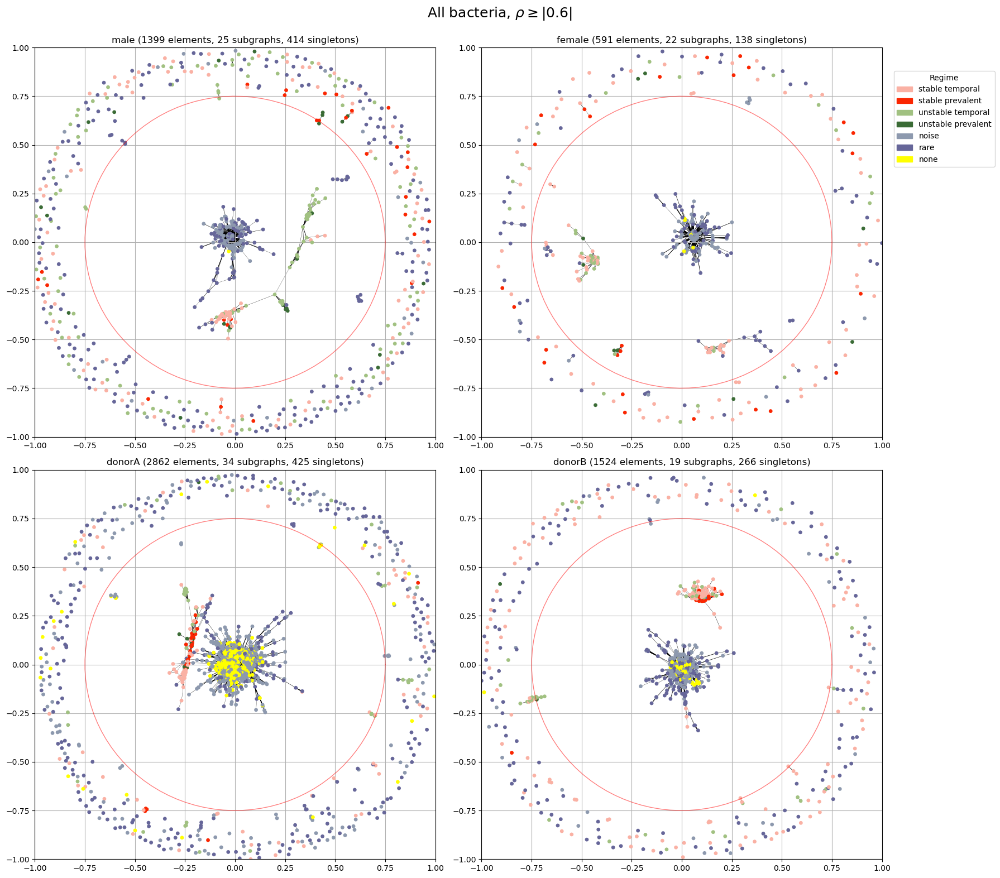

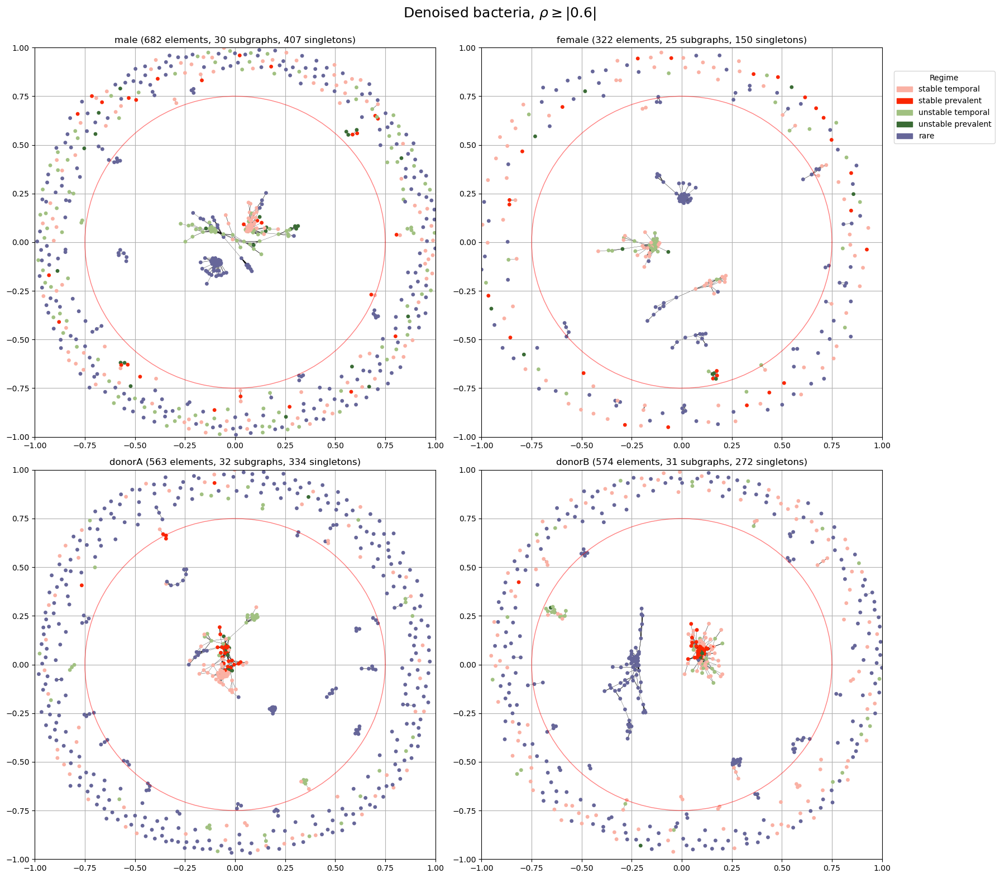

In [29]:
# Regime
feature = 'regime_num'
label = 'Regime'
colors = ['#fab1a4', '#fa2601',  '#a1c181', '#3A6B35', '#8d99ae', '#666699']
n_colors = len(features[feature].unique())
palette = sns.color_palette(colors)
for (graph, positions), id_ in zip(data, ids):
    create_graph(graph, positions, features, feature, label, n_colors, palette, dict_lab=feature_num_d[feature], 
                 bin_evenly=True, save=True, show_edges=True, show_nan=True, draw_circle=True, circle_r=0.75, identifier=id_, thr=rho_nx)

## Supplementary Figure 15B

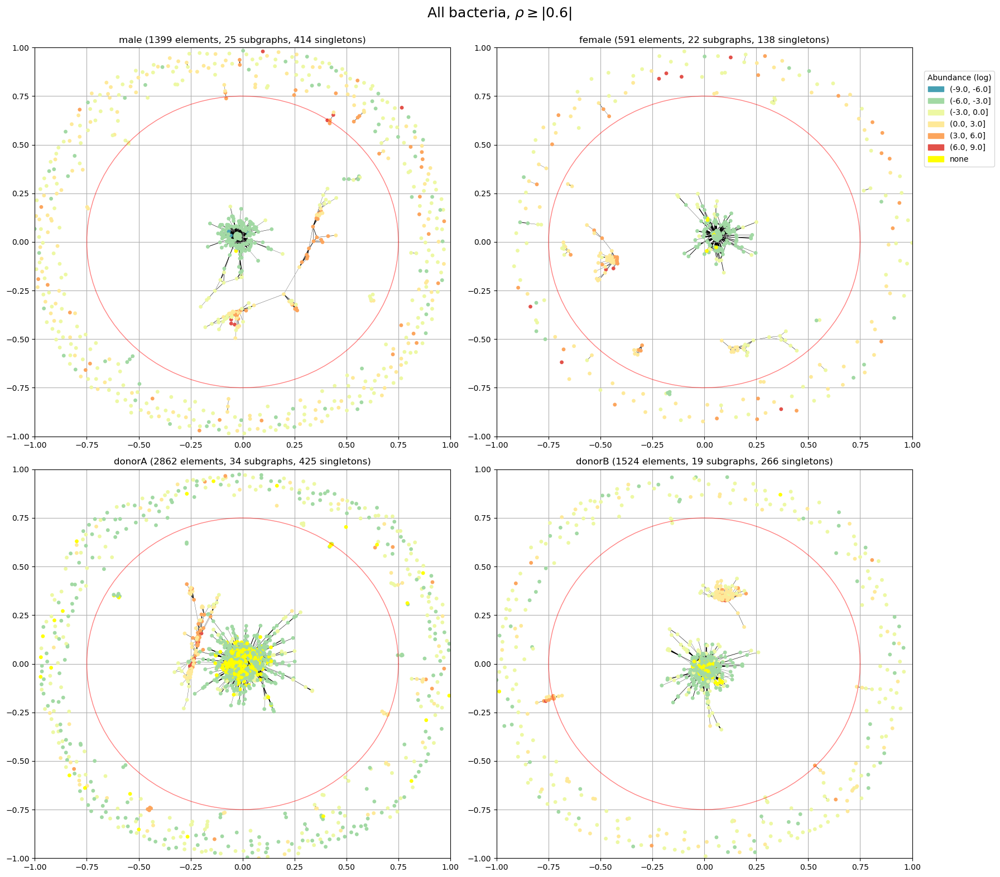

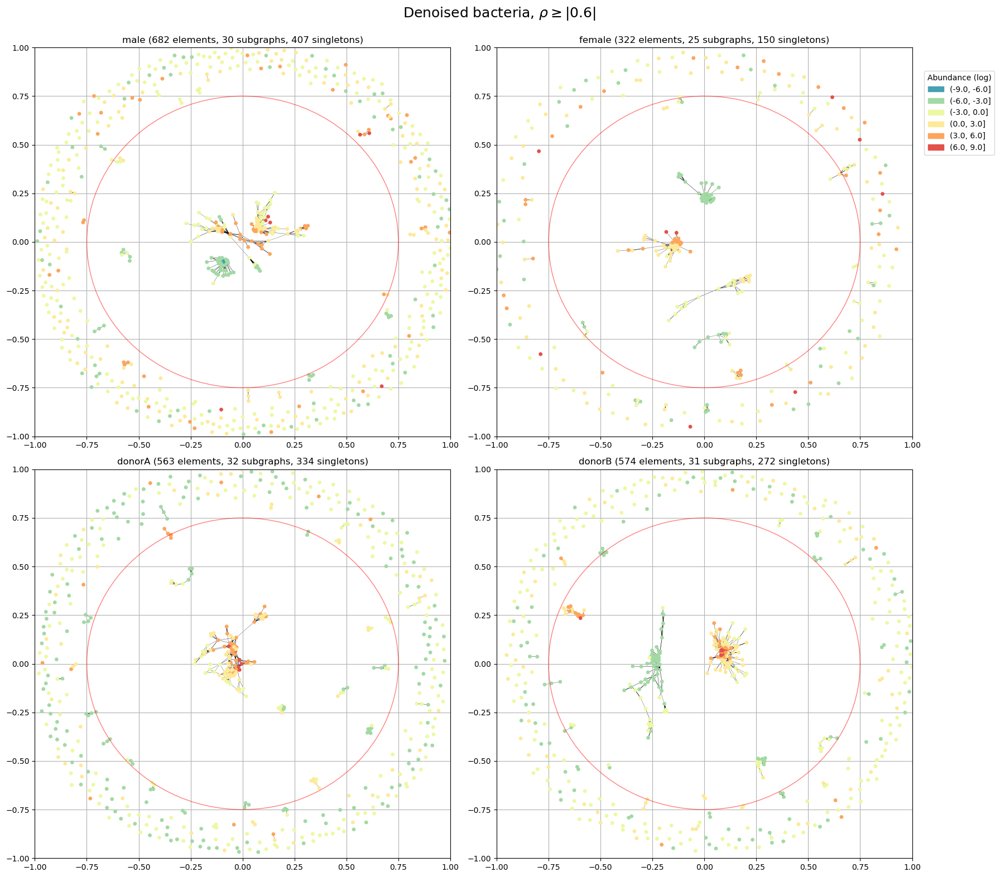

In [30]:
feature = 'abundance_cat'
label = 'Abundance (log)'
n_colors = len(features[feature].unique())
palette = sns.color_palette("Spectral_r", n_colors, as_cmap=False)
for (graph, positions), id_ in zip(data, ids):
    create_graph(graph, positions, features, feature, label, n_colors, palette, dict_lab=None,
             bin_evenly=True, save=True, show_edges=True, show_nan=True, draw_circle=True, circle_r=0.75, identifier=id_, thr=rho_nx)

## Supplementary Figure 15C

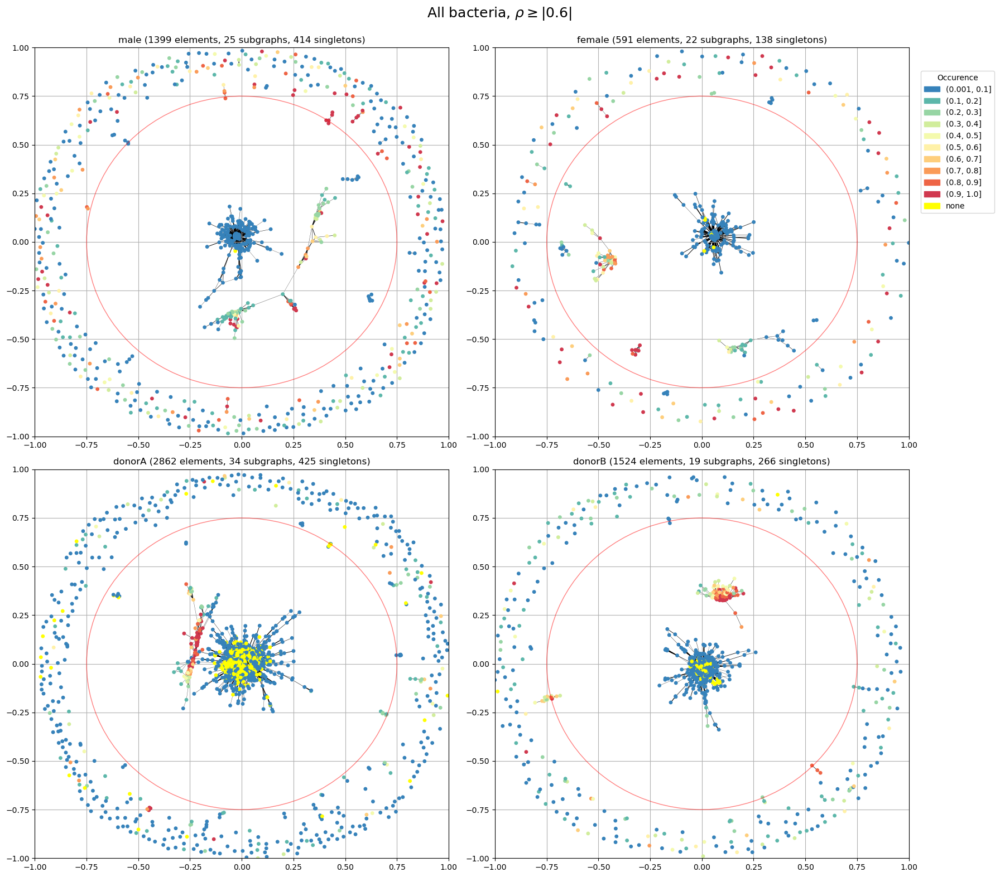

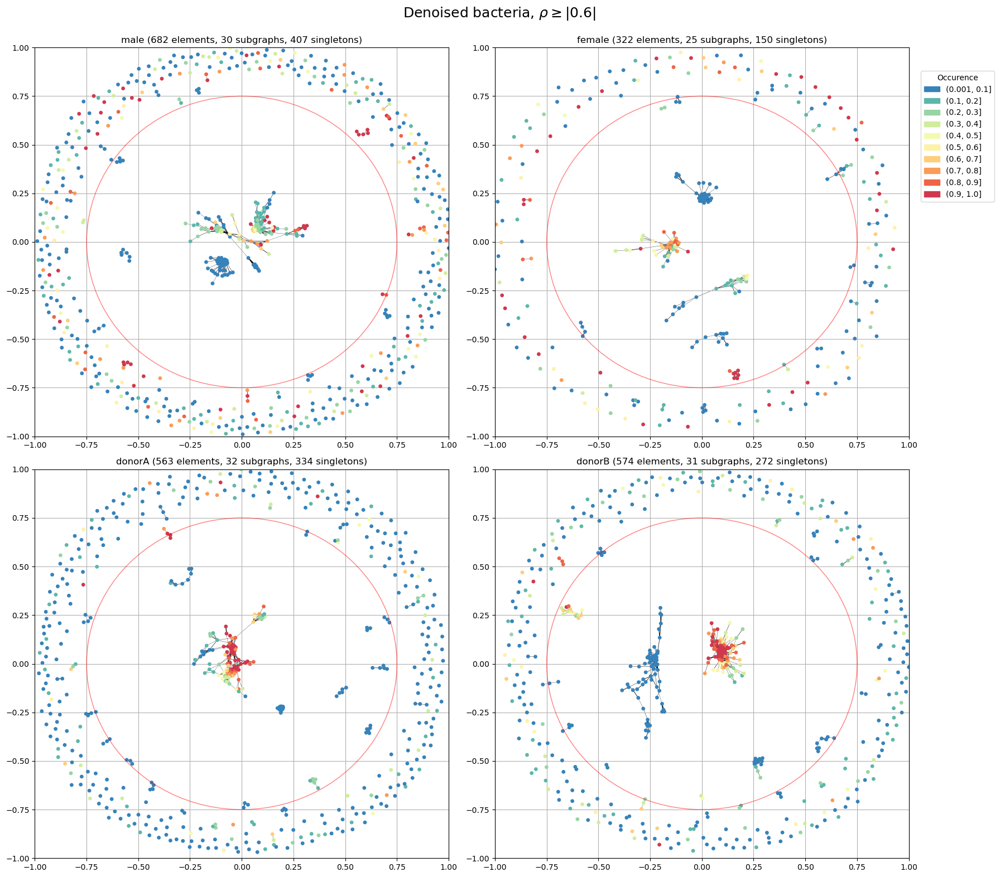

In [31]:
feature = 'prevalence'
label = 'Occurence'
n_colors = 10
palette = sns.color_palette("Spectral_r", n_colors, as_cmap=False)
for (graph, positions), id_ in zip(data, ids):
    create_graph(graph, positions, features, feature, label, n_colors, palette, dict_lab=None,
             bin_evenly=True, save=True, show_edges=True, show_nan=True, draw_circle=True, circle_r=0.75, identifier=id_, thr=rho_nx)

## Supplementary Figure 15D

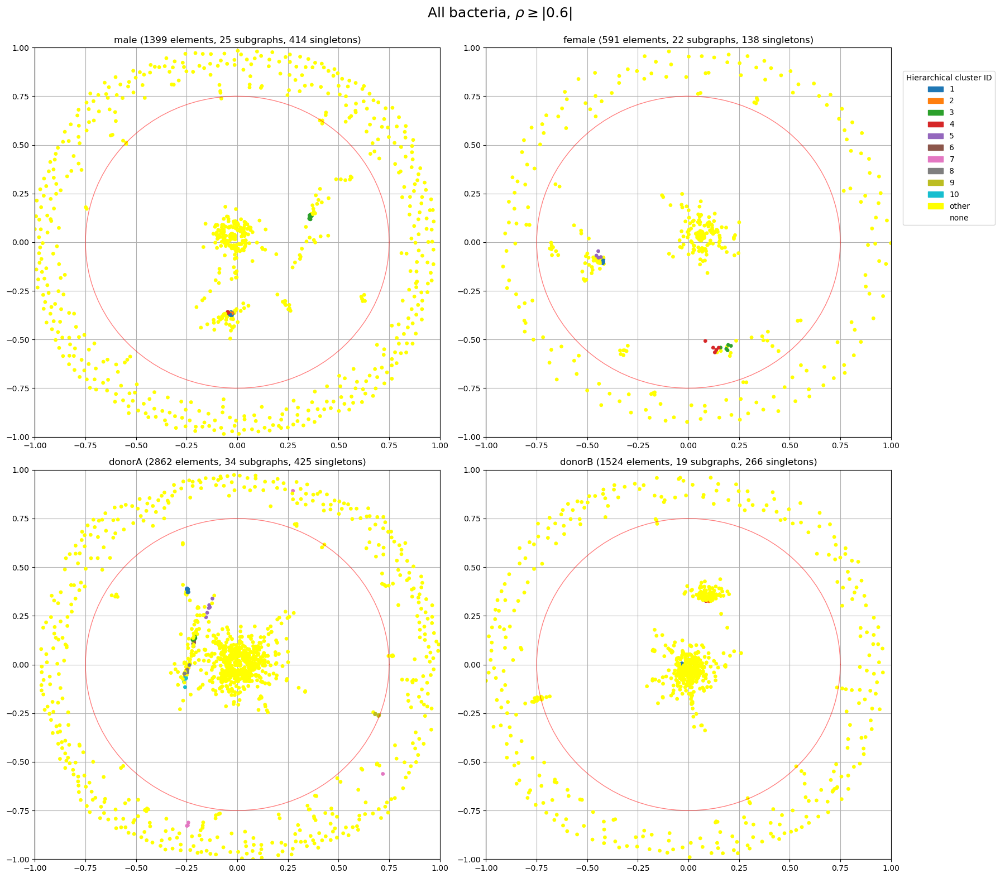

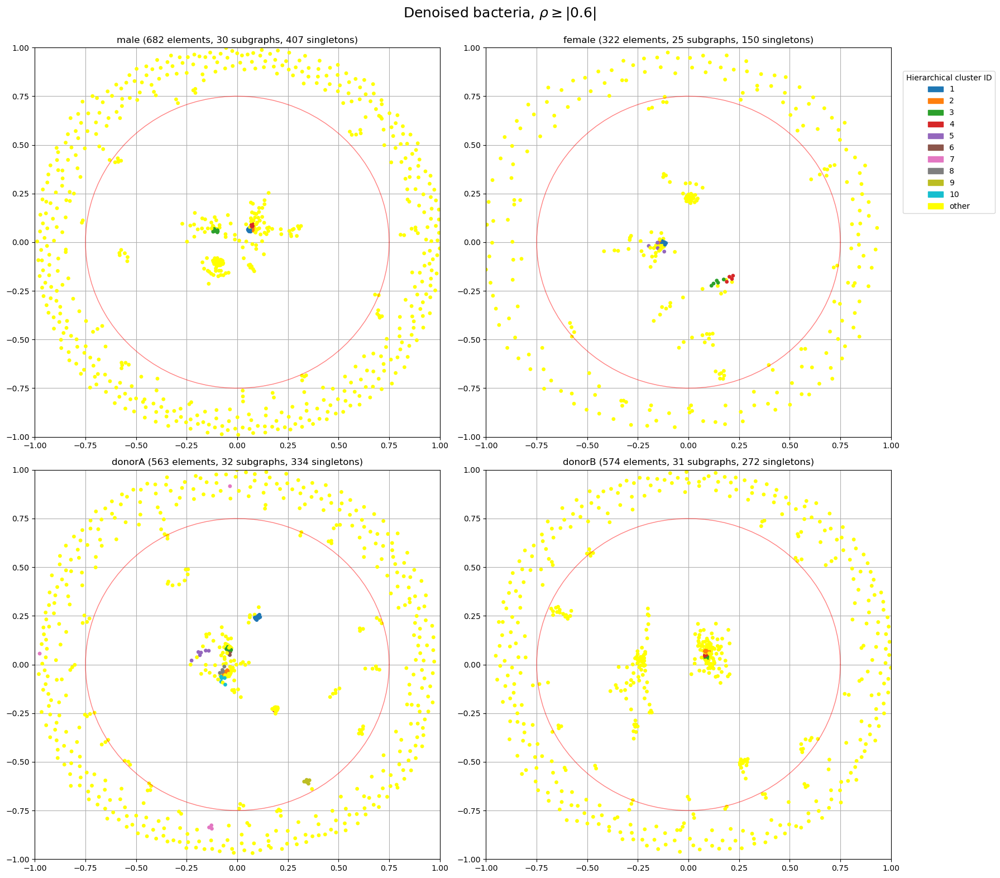

In [32]:
feature = 'cluster_id'
label = 'Hierarchical cluster ID'
n_colors = len(features[feature].unique())
palette = sns.color_palette(n_colors=n_colors)
palette[-1] = [1, 1, 0]  # yellow
for (graph, positions), id_ in zip(data, ids):
    create_graph(graph, positions, features, feature, label, n_colors, palette, dict_lab=feature_num_d[feature], 
                 bin_evenly=True, save=True, show_edges=False, show_nan=False, draw_circle=True, circle_r=0.75, identifier=id_, thr=rho_nx)

## Supplementary Figure 15E

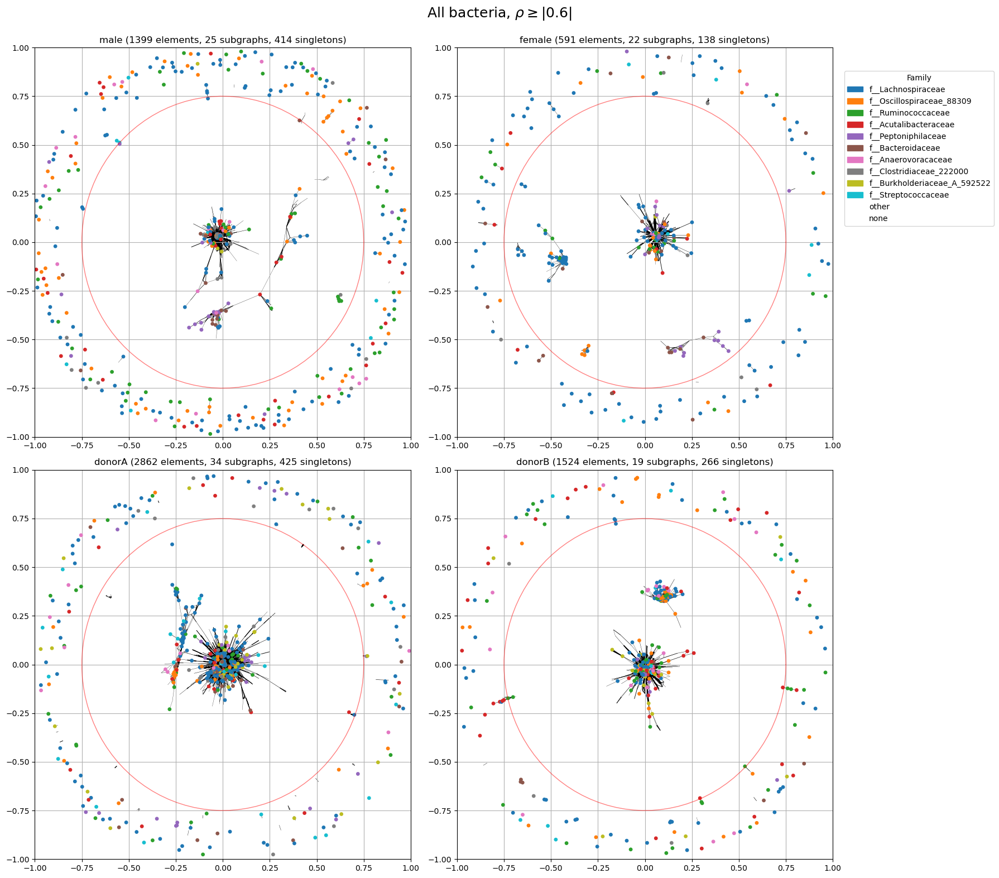

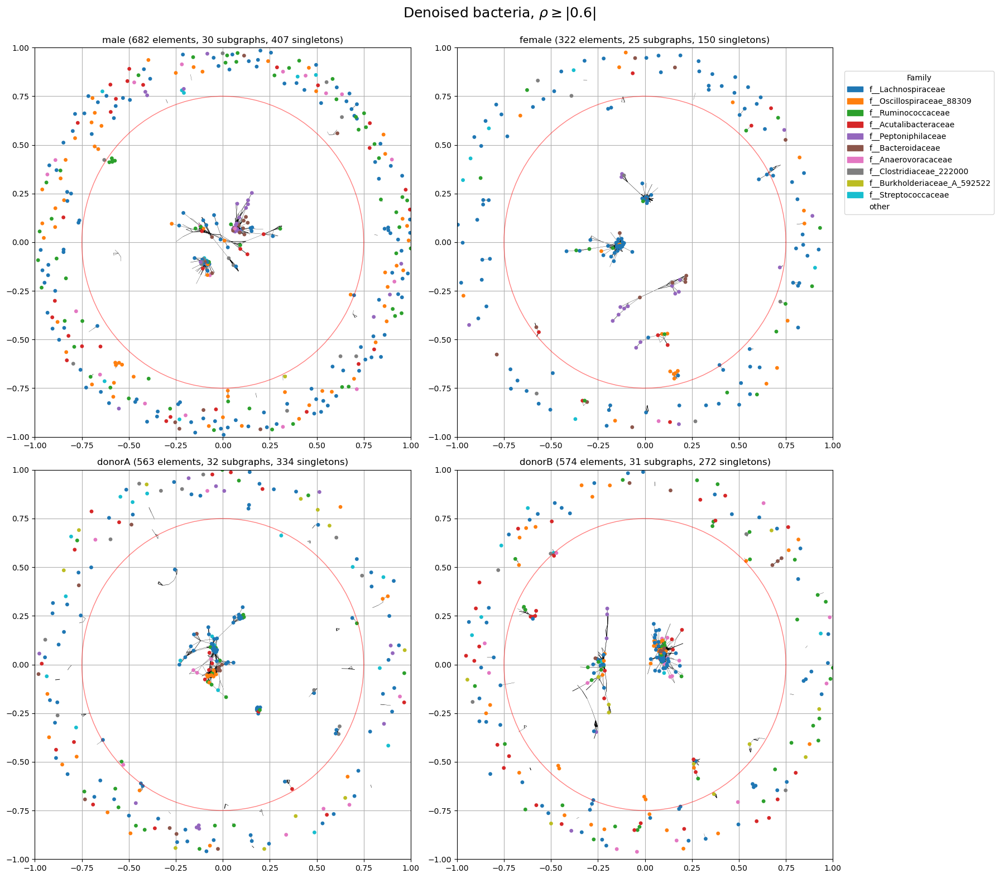

In [33]:
# Taxonomy
feature = 'Family_num'
label = 'Family'
n_colors = len(features[feature].unique())
palette = sns.color_palette(n_colors=n_colors)
palette[-1] = [1,1,1, 0] # transparent
for (graph, positions), id_ in zip(data, ids):
    create_graph(graph, positions, features, feature, label, n_colors, palette, dict_lab=feature_num_d[feature], 
                 bin_evenly=True, save=True, show_edges=True, show_nan=False, draw_circle=True, circle_r=0.75, identifier=id_, thr=rho_nx)

## Supplementary Figure 15F

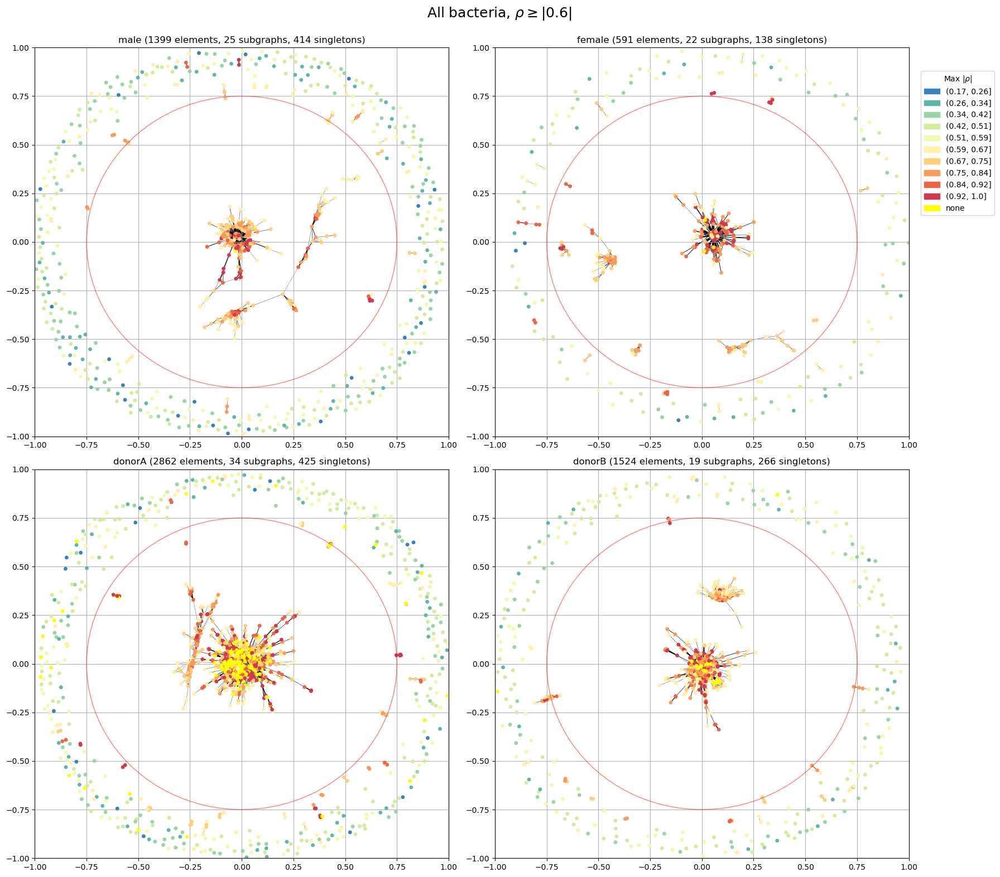

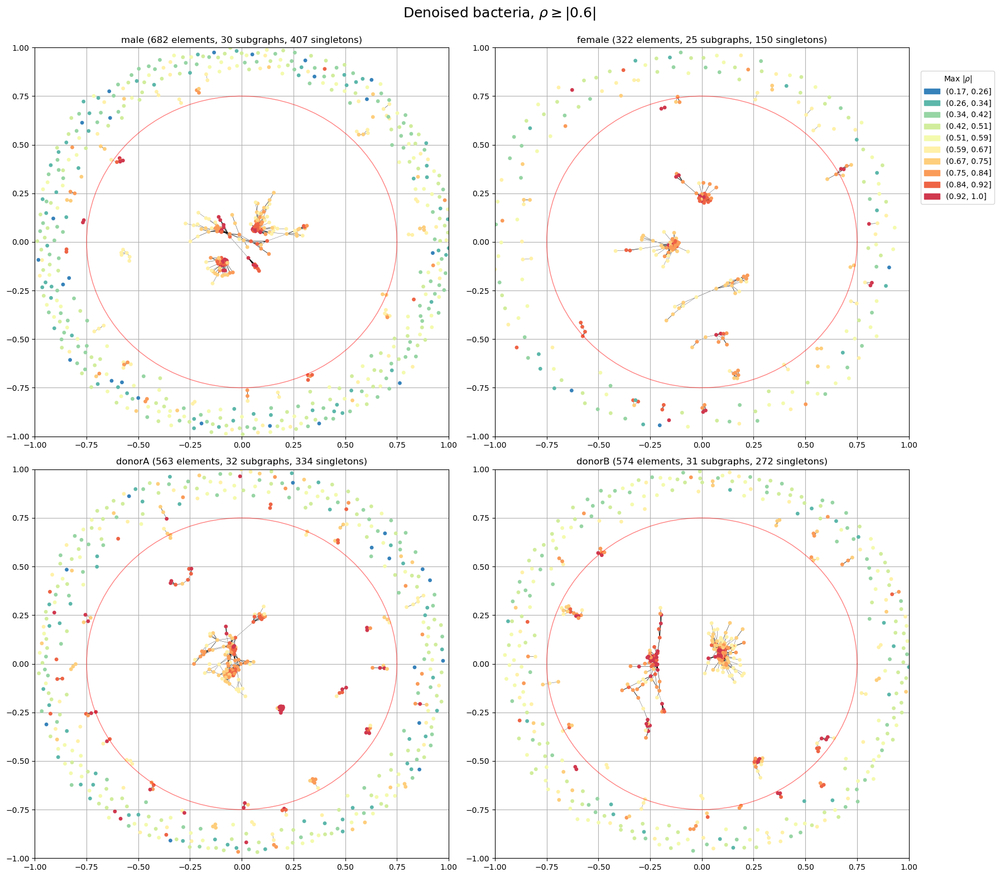

In [34]:
feature = 'max_rho'
label = r'Max $|\rho|$'
n_colors = 10
palette = sns.color_palette("Spectral_r", n_colors, as_cmap=False)
for (graph, positions), id_ in zip(data, ids):
    create_graph(graph, positions, features, feature, label, n_colors, palette, dict_lab=None,
                 bin_evenly=True, save=True, show_edges=True, show_nan=True, draw_circle=True, circle_r=0.75, identifier=id_, thr=rho_nx)

## Supplementary Figure 15G

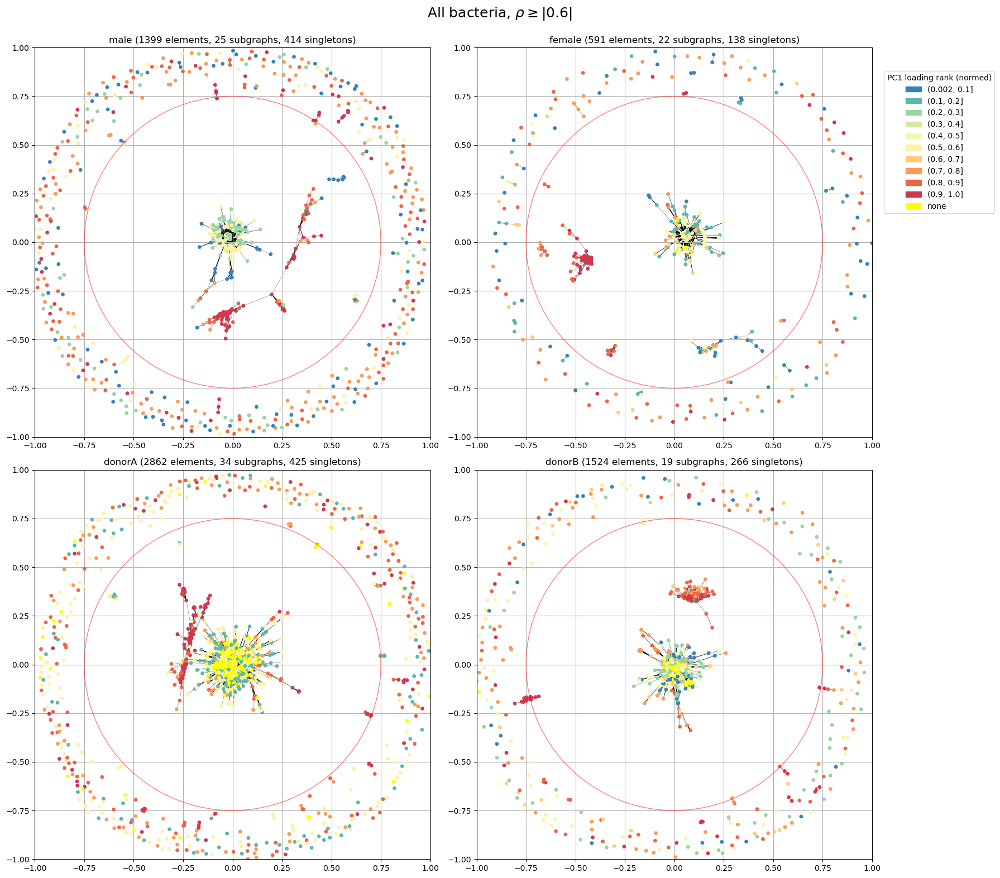

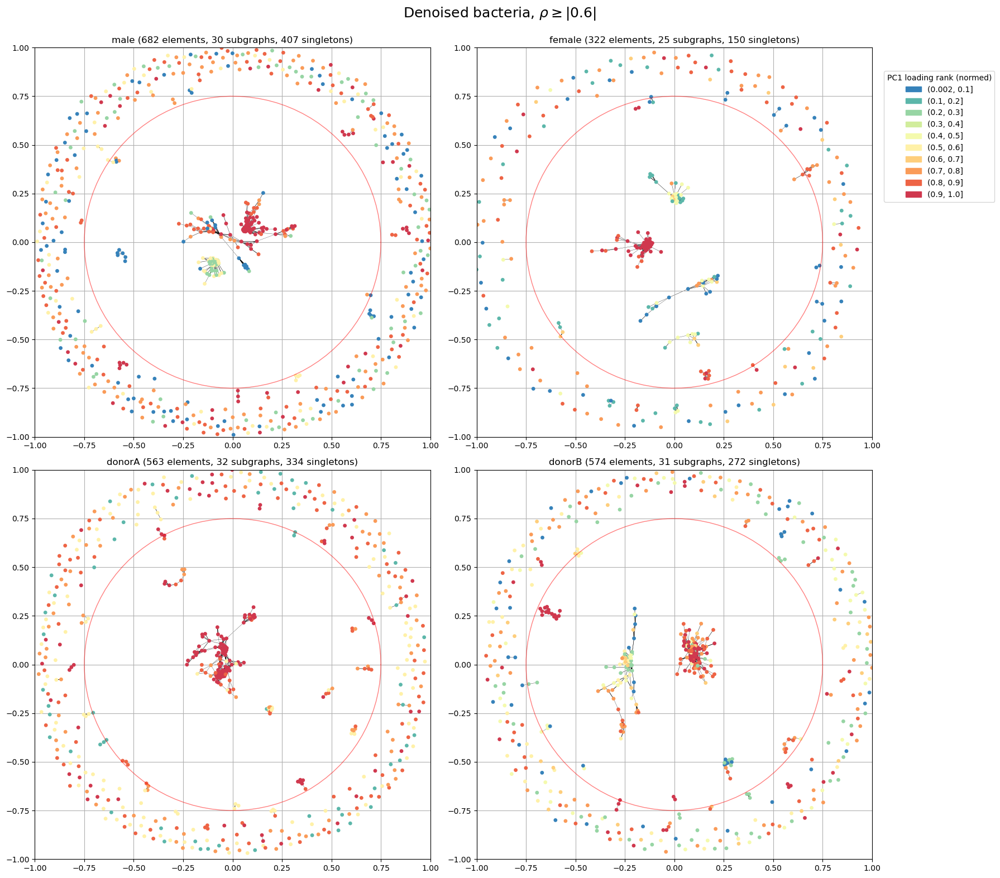

In [35]:
feature = 'PC1_rank_normed'
label = 'PC1 loading rank (normed)'
n_colors = 10
palette = sns.color_palette("Spectral_r", n_colors, as_cmap=False)
for (graph, positions), id_ in zip(data, ids):
    create_graph(graph, positions, features, feature, label, n_colors, palette, dict_lab=None,
                 bin_evenly=True, save=True, show_edges=True, show_nan=True, draw_circle=True, circle_r=0.75, identifier=id_, thr=rho_nx)

## Supplementary Figure 15H

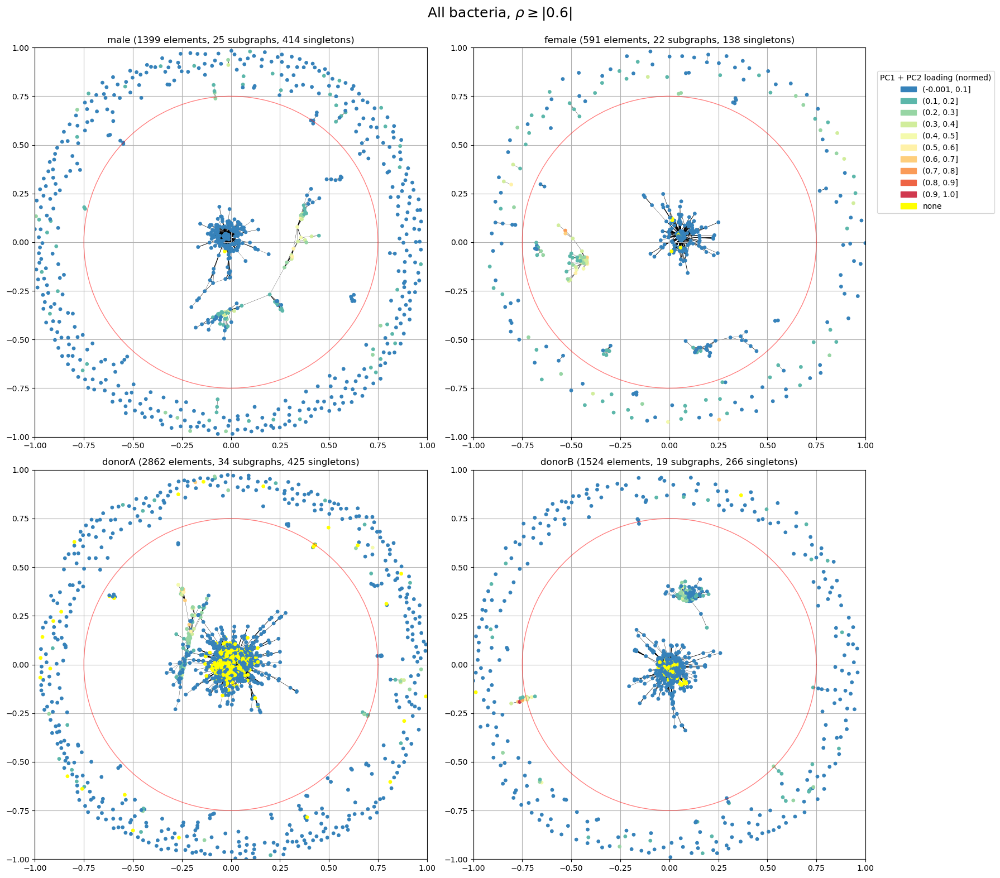

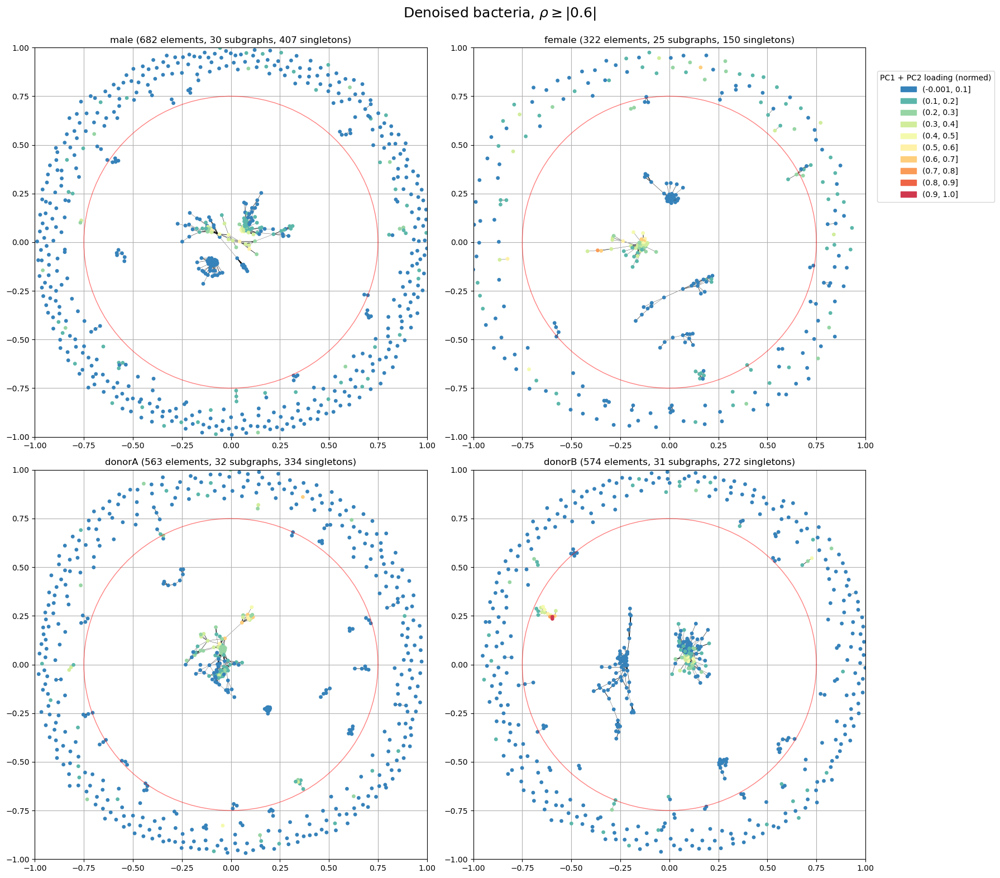

In [36]:
feature = 'PC12_normed'
label = 'PC1 + PC2 loading (normed)'
n_colors = 10
palette = sns.color_palette("Spectral_r", n_colors, as_cmap=False)
for (graph, positions), id_ in zip(data, ids):
    create_graph(graph, positions, features, feature, label, n_colors, palette, dict_lab=None,
                 bin_evenly=True, save=True, show_edges=True, show_nan=True, draw_circle=True, circle_r=0.75, identifier=id_, thr=rho_nx)

## Supplementary Figure 15I

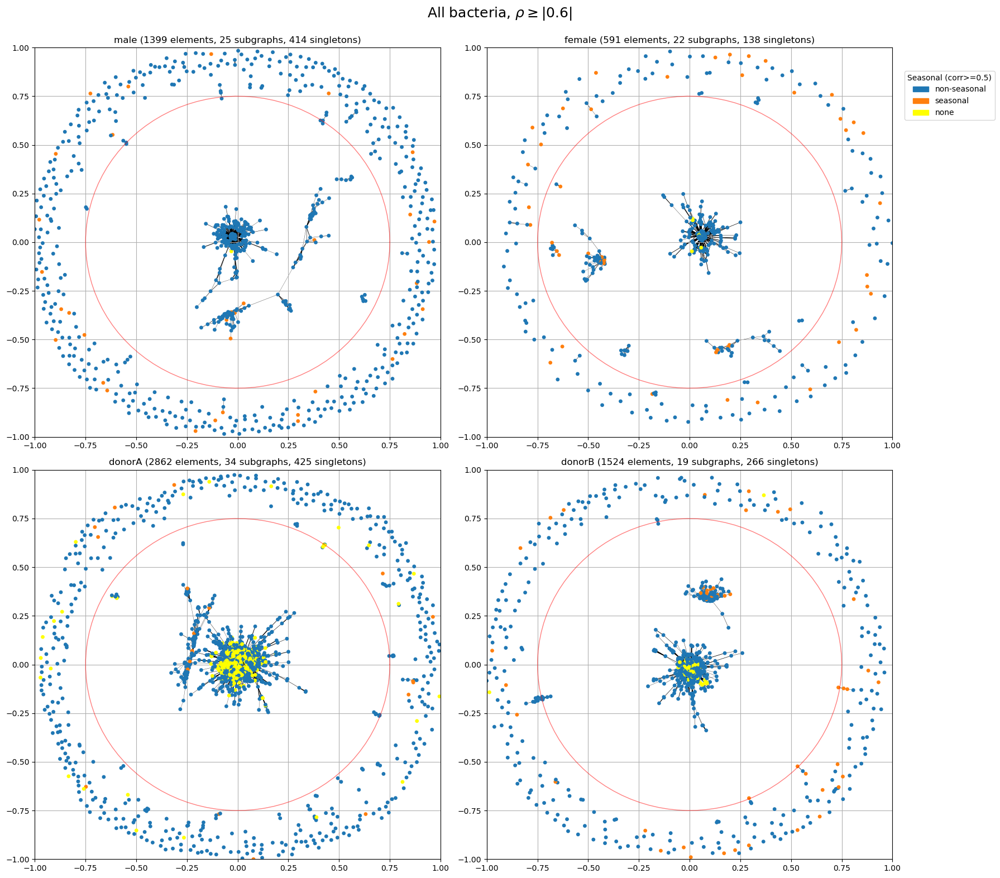

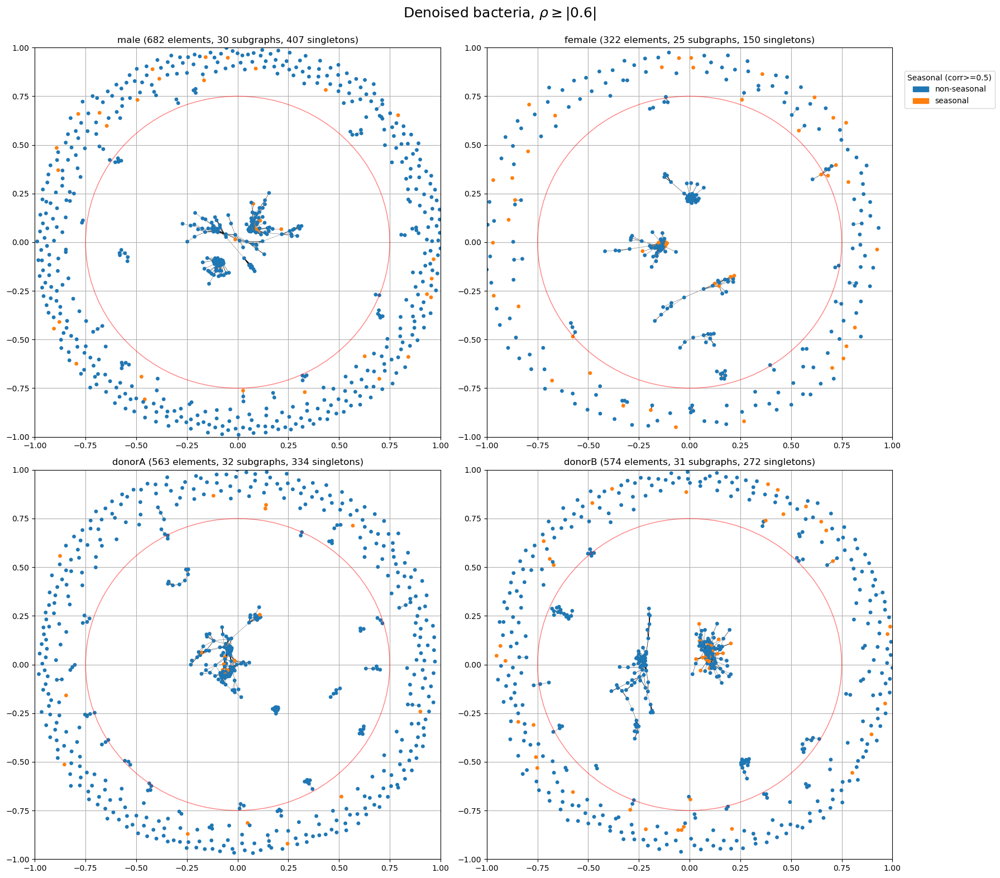

In [37]:
feature = 'seasonal_corr_5'
label = 'Seasonal (corr>=0.5)'
n_colors = len(features[feature].unique())
palette = sns.color_palette(n_colors=n_colors)
for (graph, positions), id_ in zip(data, ids):
    create_graph(graph, positions, features, feature, label, n_colors, palette, dict_lab=feature_num_d[feature], 
             bin_evenly=True, save=True, show_edges=True, show_nan=True, draw_circle=True, circle_r=0.75, identifier=id_, thr=rho_nx)

## Supplementary Figure 15J

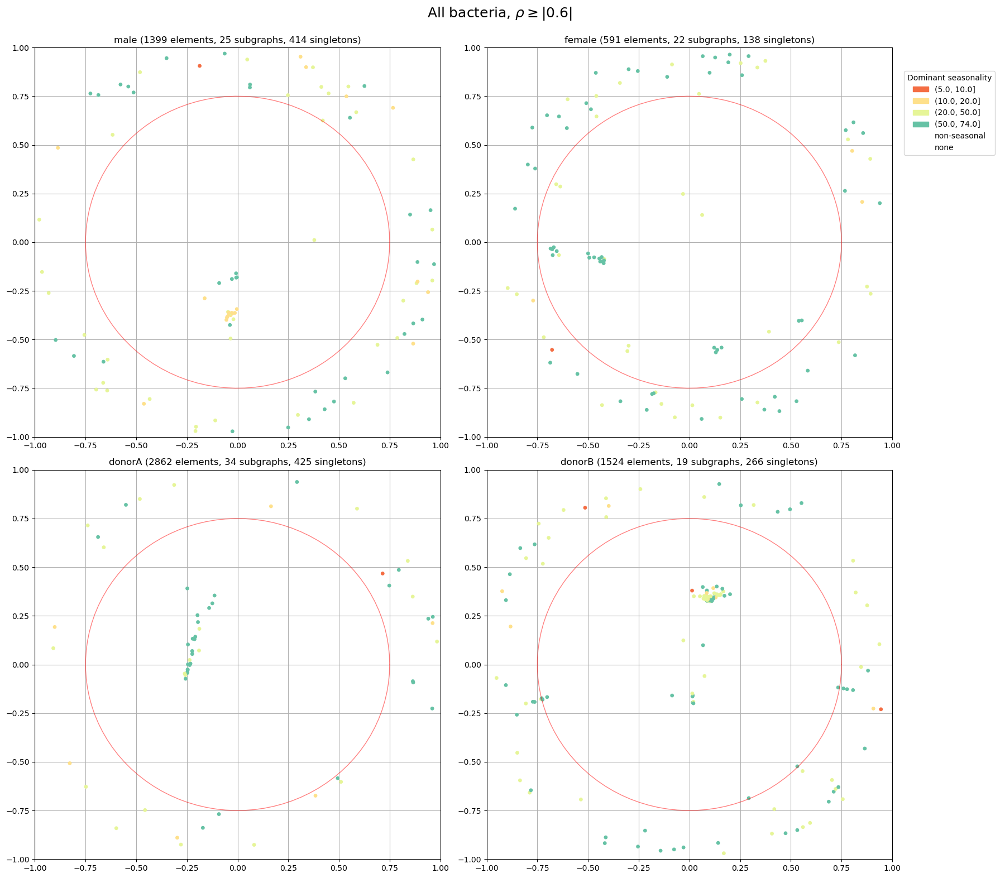

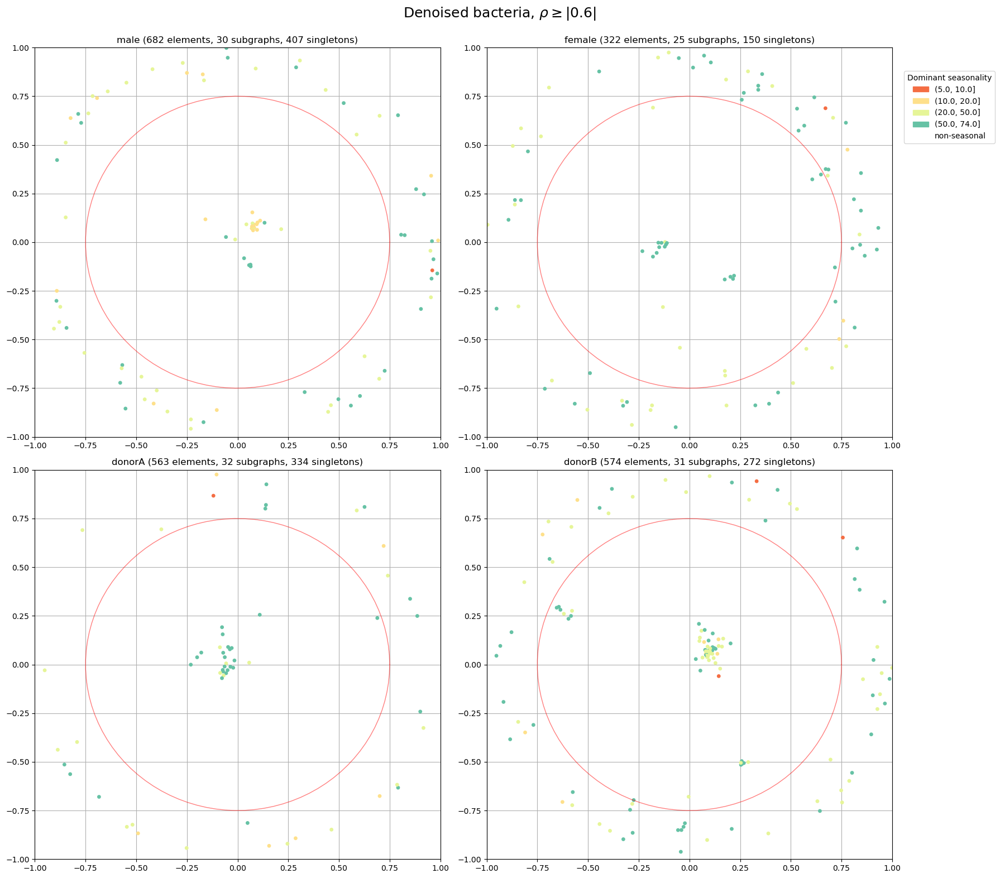

In [38]:
feature = '1st_mode_adj_txt'
label = 'Dominant seasonality'
n_colors = len(features[feature].unique())
palette = sns.color_palette("Spectral", n_colors=n_colors-1)
palette += [[1, 1, 1, 0]] # transparent
for (graph, positions), id_ in zip(data, ids):
    create_graph(graph, positions, features, feature, label, n_colors, palette, dict_lab=feature_num_d[feature], 
             bin_evenly=True, save=True, show_edges=False, show_nan=False, draw_circle=True, circle_r=0.75, identifier=id_, thr=rho_nx)

## Supplementary Figure 15K

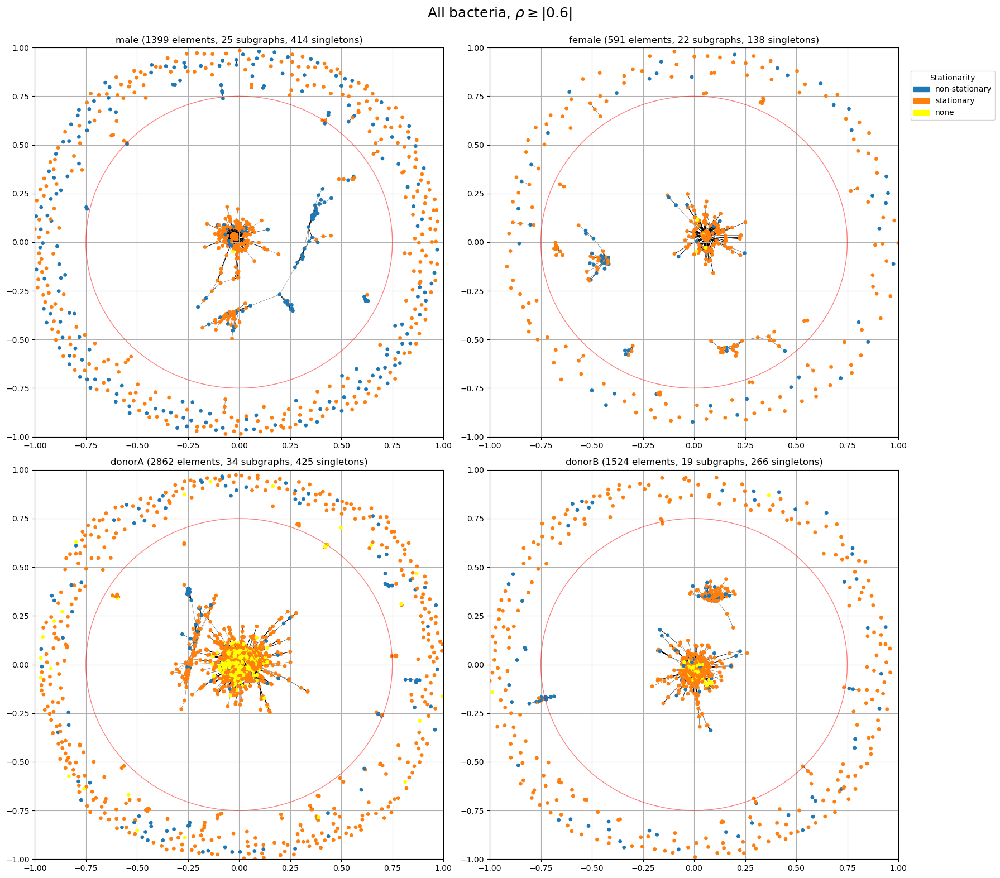

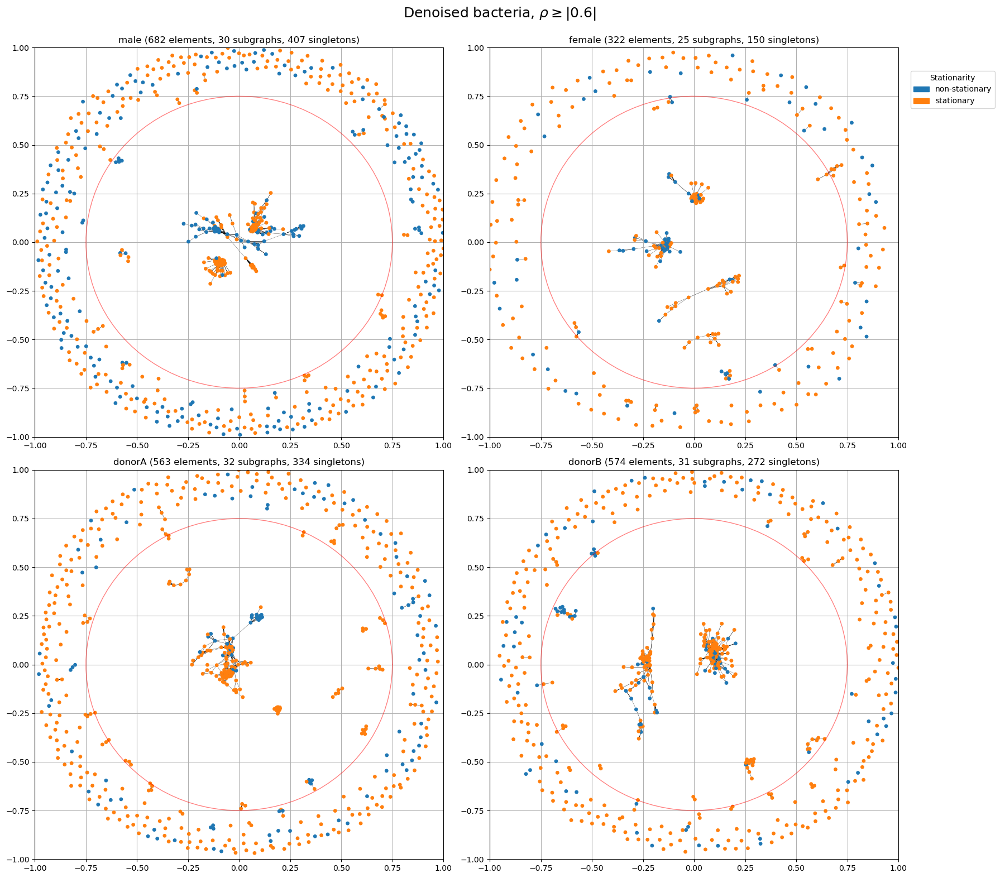

In [39]:
feature = 'stationary'
label = 'Stationarity'
n_colors = len(features[feature].unique())
palette = sns.color_palette(n_colors=n_colors)
for (graph, positions), id_ in zip(data, ids):
    create_graph(graph, positions, features, feature, label, n_colors, palette, dict_lab=feature_num_d[feature], 
             bin_evenly=True, save=True, show_edges=True, show_nan=True, draw_circle=True, circle_r=0.75, identifier=id_, thr=rho_nx)

## Additional - not shown in the supplement

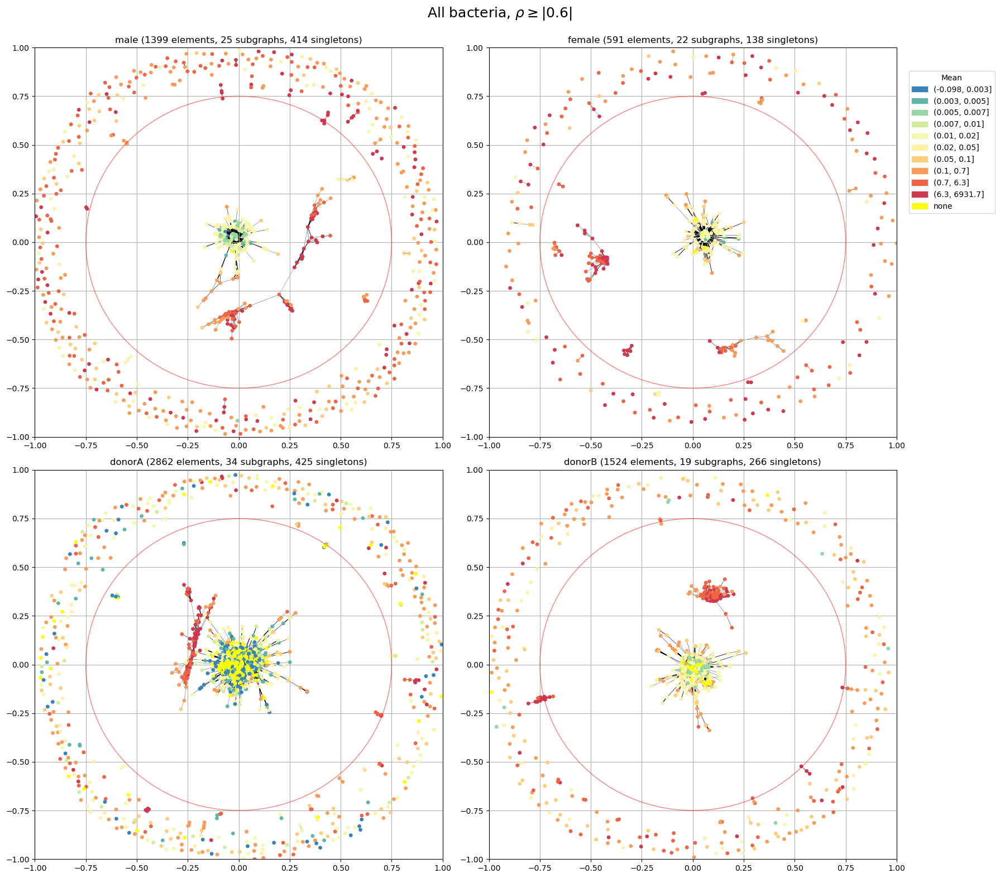

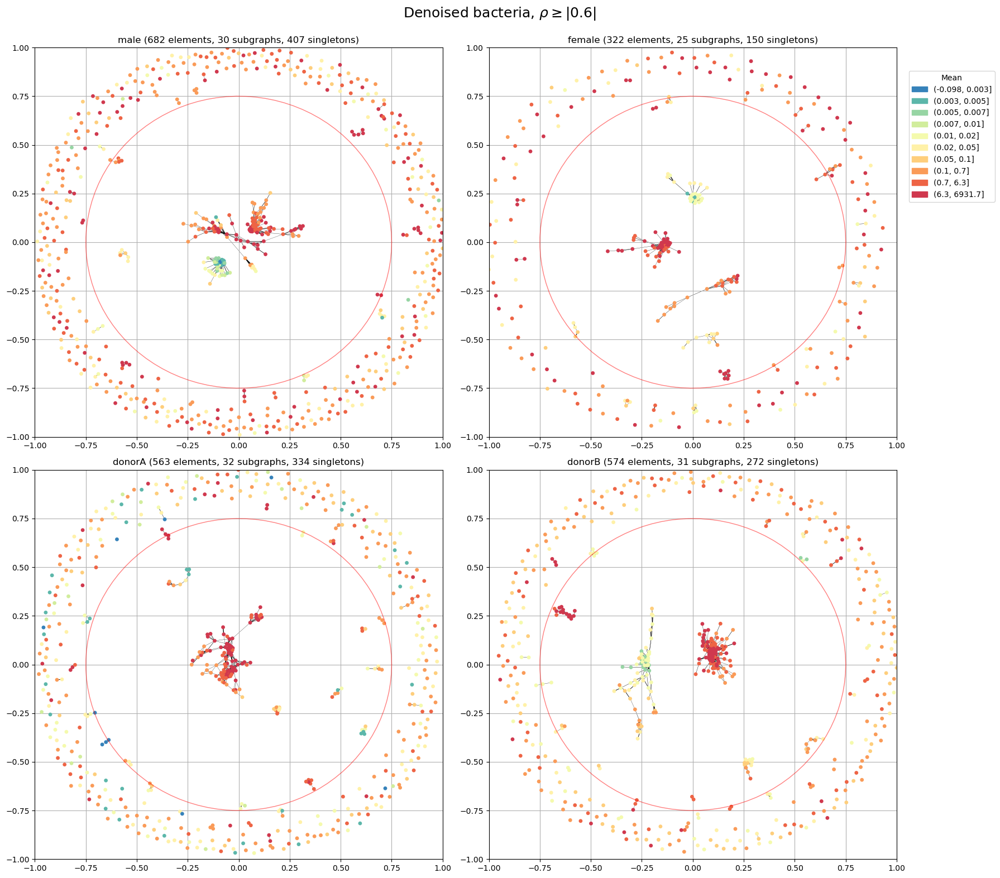

In [40]:
feature = 'abundance'
label = 'Mean'
n_colors = 10
palette = sns.color_palette("Spectral_r", n_colors, as_cmap=False)
for (graph, positions), id_ in zip(data, ids):
    create_graph(graph, positions, features, feature, label, n_colors, palette, dict_lab=None,
                 bin_evenly=False, save=True, show_edges=True, show_nan=True, draw_circle=True, circle_r=0.75, identifier=id_, thr=rho_nx)

---
# Manual inspection with Plotly
---

In [41]:
assert rho_nx == 0.6  # examples (below) have been retrieved for such a value

## Generate interactive panels

In [42]:
bact_pos = {}
for d in dnames:
    xy = np.array([*poses_denoised[d].values()])
    bact_pos[d] = pd.DataFrame(index=poses_denoised[d].keys(), data={"x": list(xy[:, 0]), "y": list(xy[:, 1])})
    bact_pos[d] = bact_pos[d].reset_index(names='species').reset_index(names='index')
    fig = px.scatter(bact_pos[d], x="x", y="y", hover_data=['index', 'species'])#, color="species",  size='petal_length', hover_data=['petal_width'])
    fig.update_yaxes(scaleanchor="x",  scaleratio=1)
    plotly.offline.plot(fig, filename=str(MAIN_PATH / 'output' / 'graphs' / f"{d}.html"))

## Identify representative bacteria

This has to be done manually!

In [43]:
examples = {}
examples['male'] = {'A': [41, 39, 49, 74, 147, 51, 101, 362,
                           435, 331, 344],
                    'B': [271, 282, 288, 290, 300, 178, 477],}
examples['female'] = {'A': [35, 39, 89, 126, 67, 96, 93, 90, 274],
                     'B': [154, 153, 163, 182, 162, 205],
                      'C': [73, 72, 75, 109, 110],}
examples['donorA'] = {'A': [98, 164, 274, 168, 266, 299, 106, 140, 144,
                            7, 109, 84, 260, 177, 209, 63, 267],
                      'B': [256, 257, 263, 271, 279, 288],}
examples['donorB'] = {'A': [472, 563, 569, 382, 553, 551, 489, 535, 432, 342, 495, 485, 312],
                     'B': [103, 52, 23, 1, 21, 48, 49, 238, 240, 196, 120, 53, 79]}

## Supplementary Figure 17

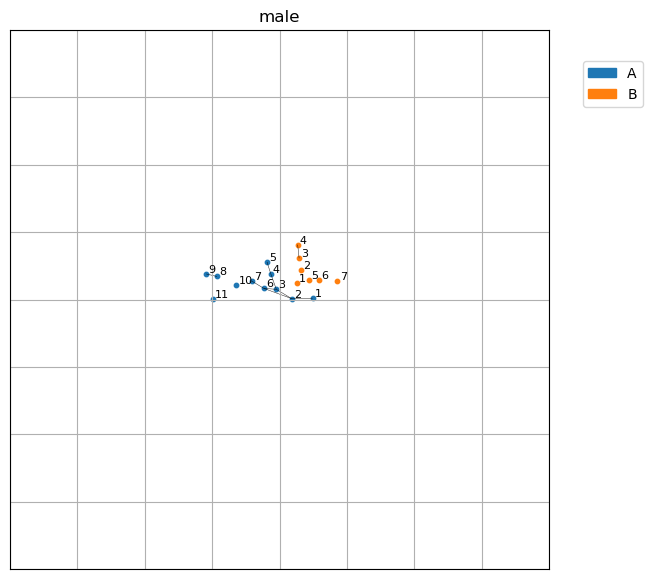

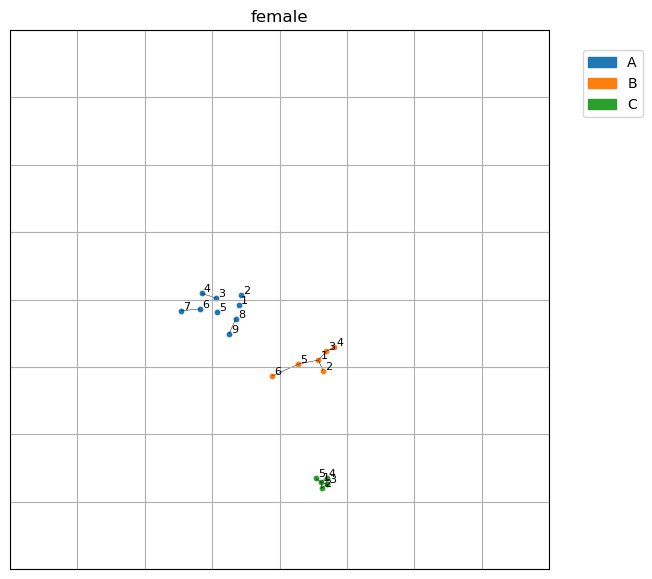

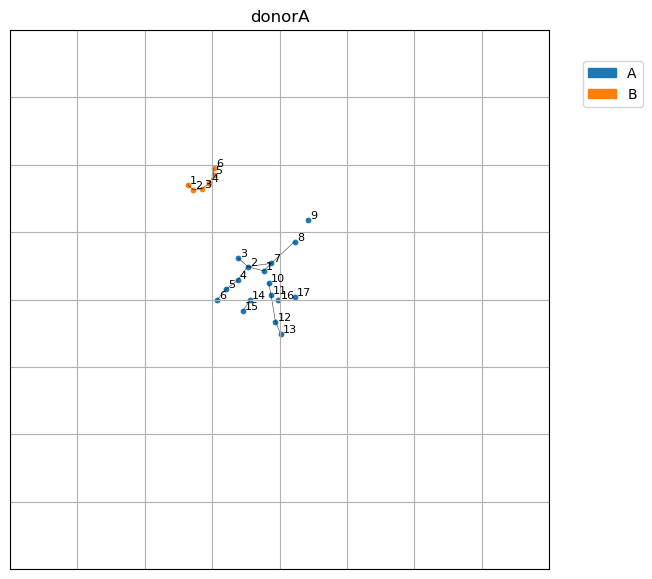

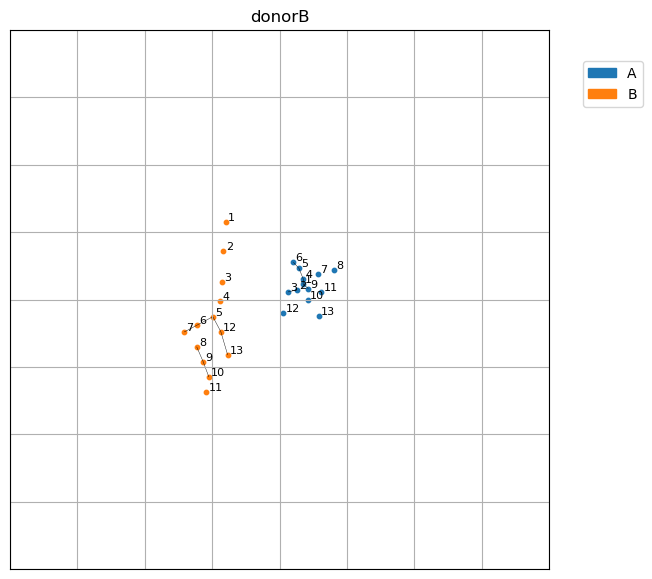

In [44]:
for dname in dnames:
    plt.figure(figsize=(7, 7), facecolor='white')
    palette = sns.color_palette(n_colors=len(examples[dname]))
    handles = []
    all_bacts = []
    for idx_clu, (name, group) in enumerate(examples[dname].items()):
        color = palette[idx_clu]
        handles.append(mpatches.Patch(color=color, label=name))
        all_bacts.extend(bact_pos[dname].query('index.isin(@group)').species.values)
        for i, idx_ex in enumerate(group):
            row = bact_pos[dname].query('index == @idx_ex')
            ax = plt.scatter(row.x, row.y, s=10, color=color)
            plt.text(row.x.iloc[0]+0.008, row.y.iloc[0]+0.005, i+1, fontsize=8)
            # plt.annotate(idx, (row.x, row.y))
            plt.gca().set_aspect('equal')
            plt.legend(handles=handles, loc='center left', #title=label, 
                       bbox_to_anchor=(1.05, .9))
    H = nx.subgraph(Gs_denoised[dname], all_bacts)
    nx.draw_networkx_edges(H, poses_denoised[dname], width=0.3)#.get_paths()
    # for path in paths.get_paths():
    #     plt.plot(path.vertices[:, 0], path.vertices[:, 1], color='k', linewidth=0.3)
    plt.xlim([-1, 1])
    plt.ylim([-1, 1])
    plt.title(dname)
    plt.grid(True)
    plt.savefig(MAIN_PATH / 'output' / 'examples' / f'networx_{rho_nx}_{dname}.png', dpi=400, bbox_inches='tight')
    plt.show()

## Supplementary Figure 18

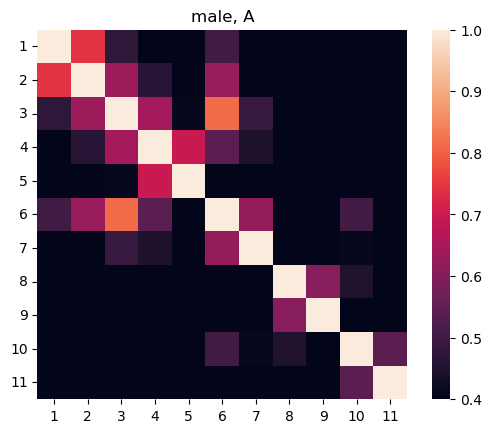

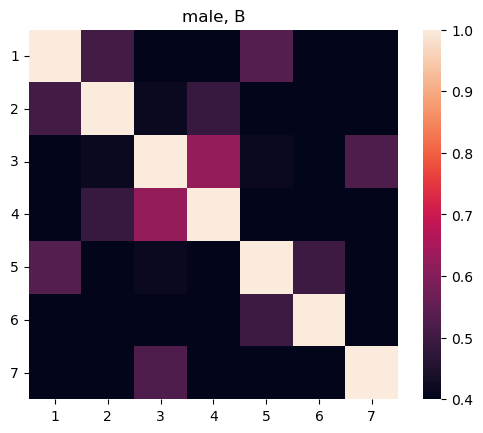

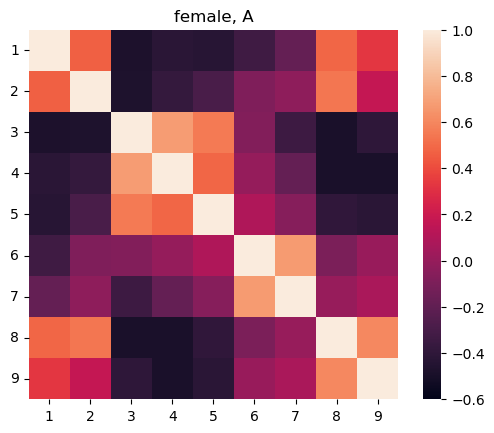

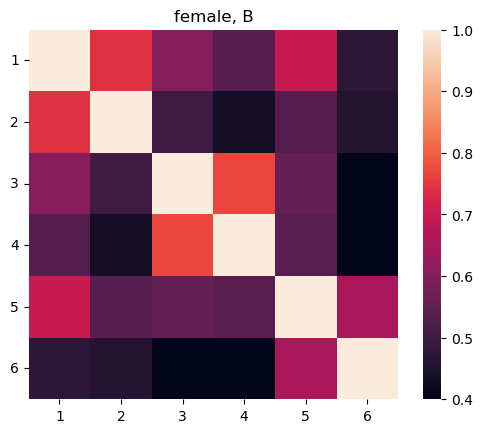

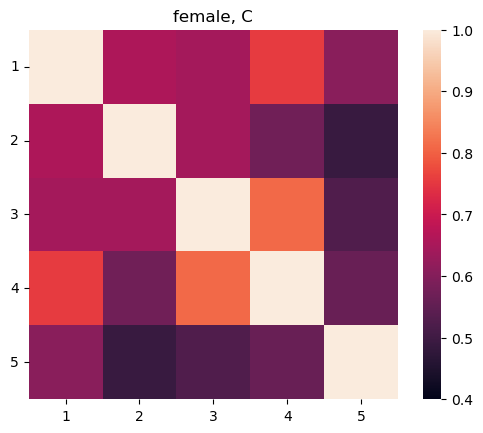

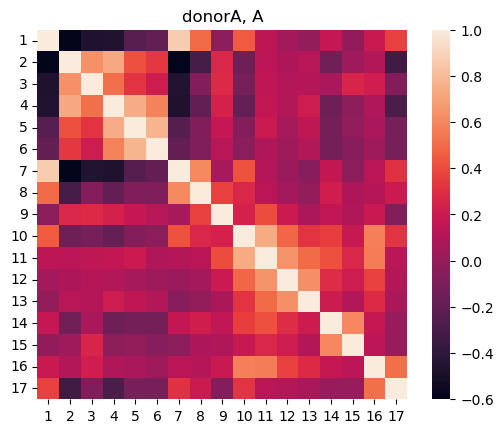

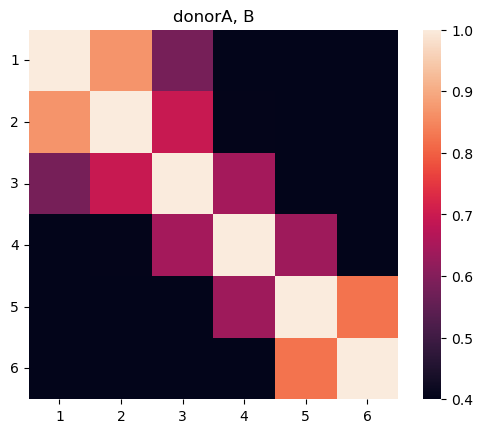

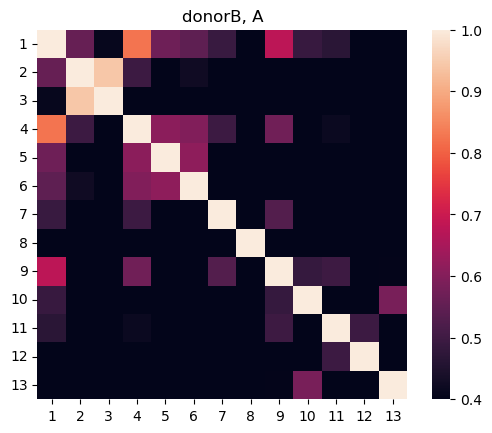

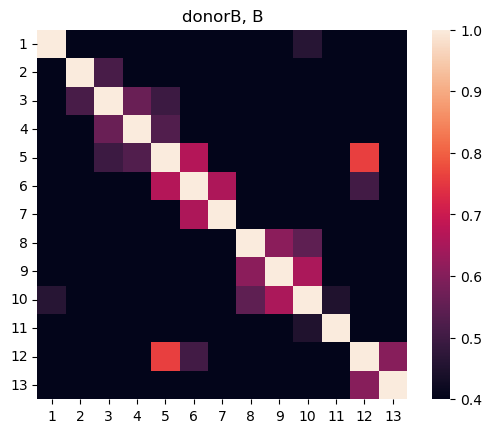

In [45]:
for dname in dnames:
    for idx_clu, (name, group) in enumerate(examples[dname].items()):
        plt.figure()
        bacts = [bact_pos[dname].query('index == @idx').species.values[0] for idx in group]
        col_idx = [clr_df[dname].columns.get_loc(col) for col in bacts]
        ticks = [el+1 for el in range(len(group))]
        dat = rho_res[dname][col_idx, :][:, col_idx]
        if dat.min() < -0.2:
            vmin = -0.6
        else:
            vmin = 0.4
        sns.heatmap(dat, vmin=vmin, vmax=1, square=True, xticklabels=ticks, yticklabels=ticks)
        plt.yticks(rotation=0) 
        plt.title(f"{dname}, {name}")
        plt.savefig(MAIN_PATH / 'output' / 'examples' / f'heatmap_{rho_nx}_{dname}_{name}.png', dpi=400, bbox_inches='tight')
        plt.show()

## "Cloud" extraction

In [46]:
rho_nx = 0.6
Gs_denoised = pickle.load(open(MAIN_PATH / 'intermediate' / f'nxgraphs_denoised__{rho_nx}.pkl', 'rb'))
poses_denoised = pickle.load(open(MAIN_PATH / 'intermediate' / f'nxposes_denoised__{rho_nx}.pkl', 'rb'))

In [47]:
nxcloud_denoised = {}
r_thr = 0.75
for d in dnames:
    nxcloud_denoised[d] = []
    for bact, pos in poses_denoised[d].items():
        radius = np.sqrt(pos[0]**2 + pos[1]**2)
        if radius >= r_thr:
            nxcloud_denoised[d].append(bact)

## Prepare data

In [48]:
dname = 'male'  # change this !!!

In [49]:
# Use same colors as in NetworX graphs
c_k = ['stable temporal', 'stable prevalent', 'unstable temporal', 'unstable prevalent', 'rare']
c_v = ['#fab1a4', '#fa2601',  '#a1c181', '#3A6B35', '#666699']
handles = dict(zip(c_k, c_v))

In [50]:
total_loading = (features.query('subject == @dname').PC1_loading +\
                 features.query('subject == @dname').PC1_loading).sum()

In [51]:
comp_data = {'cloud': nxcloud_denoised[dname]}
comps = [list(i) for i in nx.connected_components(Gs_denoised[dname]) if len(i) >= 10]
comps.sort(key=len, reverse=True)
i = 0
for comp in comps:
    # do not show purely rare graphs
    if set(features.query('subject == @dname and subject_index.isin(@comp)').regime) == {'rare'}:
        continue
    i += 1
    comp_data[f"connected component #{i}"] = comp

In [52]:
rest = set(poses_denoised[dname].keys())
for comp in comp_data.values():
    rest -= set(comp)
if len(rest) > 0:
    comp_data["rest"] = list(rest)

## Figure 5B/C & Supplementary Figure 16

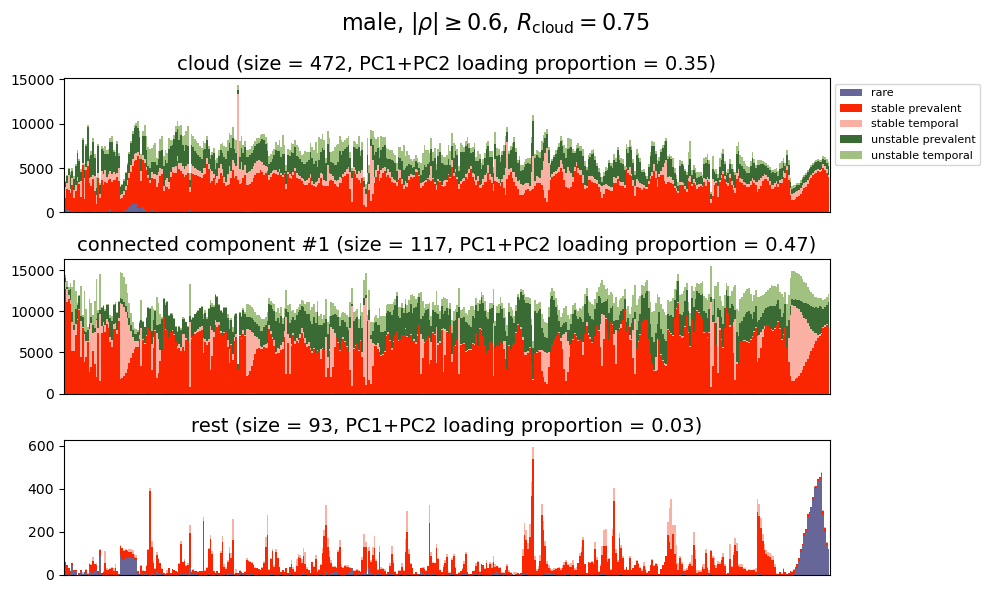

In [53]:
fig, axes = plt.subplots(nrows=len(comp_data), ncols=1, figsize=(10, 2*len(comp_data)))
for i, (txt, all_bacts) in enumerate(comp_data.items()):
    features_filtered = features.query('subject == @dname and subject_index.isin(@all_bacts)')
    regimes = features_filtered[['regime', 'subject_index']].groupby('regime').agg(list)
    df = {}
    for idx, cols in regimes.iterrows():
        bacts = cols.subject_index
        df[idx] = rarefied_df[dname][bacts].sum(axis=1)
    df = pd.DataFrame(data=df)
    # normalize
    # df = df.div(df.sum(axis=1), axis=0)
    df.plot.bar(stacked=True, width=1, ax=axes[i], color=handles)
    axes[i].set_xticks([])
    loading_ = (features_filtered.PC1_loading + features_filtered.PC1_loading).sum() / total_loading
    axes[i].set_title(f"{txt} (size = {len(all_bacts)}, PC1+PC2 loading proportion = {loading_:.2f})", fontsize=14)
    if i == 0:
        hand, lab = axes[i].get_legend_handles_labels()
        axes[i].legend(hand[::-1], lab[::-1], fontsize=8, loc='upper left', bbox_to_anchor=(1, 1))
        axes[i].legend(fontsize=8, loc='upper left', bbox_to_anchor=(1, 1))
    else:
        axes[i].legend().set_visible(False)
    # axes[i].legend().set_visible(False)
plt.suptitle(f"{dname}, " + r"$|\rho|\geq$" + f"{rho_nx}, " +  r"$R_{\rm cloud}=$" + f"{r_thr}", fontsize=16)
plt.tight_layout()
plt.savefig(MAIN_PATH / 'output' / 'examples' / f'bar_{rho_nx}_{dname}_{r_thr}.png', dpi=400, bbox_inches='tight')
plt.show()

---
# PC Loading vs $\rho$
---

## Cloud

In [54]:
rho_all = [0.4, 0.5, 0.6, 0.7]
Gs_all, poses_all = {}, {}
for rho in rho_all:    
    Gs_all[rho] = pickle.load(open(MAIN_PATH / 'intermediate' / f'nxgraphs_denoised__{rho}.pkl', 'rb'))
    poses_all[rho] = pickle.load(open(MAIN_PATH / 'intermediate' / f'nxposes_denoised__{rho}.pkl', 'rb'))    

In [55]:
nxcloud_all = {}
r_thr = 0.75
for d in dnames:
    nxcloud_all[d] = {}
    for rho in rho_all:    
        nxcloud_all[d][rho] = []
        for bact, pos in poses_all[rho][d].items():
            radius = np.sqrt(pos[0]**2 + pos[1]**2)
            if radius >= r_thr:
                nxcloud_all[d][rho].append(bact)

## Largest component

In [56]:
comps_all = {}
for d in dnames:
    comps_all[d] = {}
    for rho in rho_all:    
        comps_all[d][rho] = []
        comps = [list(i) for i in nx.connected_components(Gs_all[rho][d]) if len(i) >= 10]
        comps.sort(key=len, reverse=True)
        for comp in comps:
            # do not show purely rare graphs
            if set(features.query('subject == @d and subject_index.isin(@comp)').regime) == {'rare'}:
                continue
            comps_all[d][rho].extend(comp)

## Loading

In [57]:
loading_all = {}
for d in dnames:
    loading_all[d] = {'cloud': [], 'comp': []}
    total_loading = (features.query('subject == @d').PC1_loading +\
                 features.query('subject == @d').PC1_loading).sum()
    for rho in rho_all:  
        # cloud
        bacts = nxcloud_all[d][rho]
        features_filtered = features.query('subject == @d and subject_index.isin(@bacts)')
        loading_ = (features_filtered.PC1_loading + features_filtered.PC1_loading).sum() / total_loading
        loading_all[d]['cloud'].append(loading_)
        # cloud
        bacts = comps_all[d][rho]
        features_filtered = features.query('subject == @d and subject_index.isin(@bacts)')
        loading_ = (features_filtered.PC1_loading + features_filtered.PC1_loading).sum() / total_loading
        loading_all[d]['comp'].append(loading_)

## Figure 5D

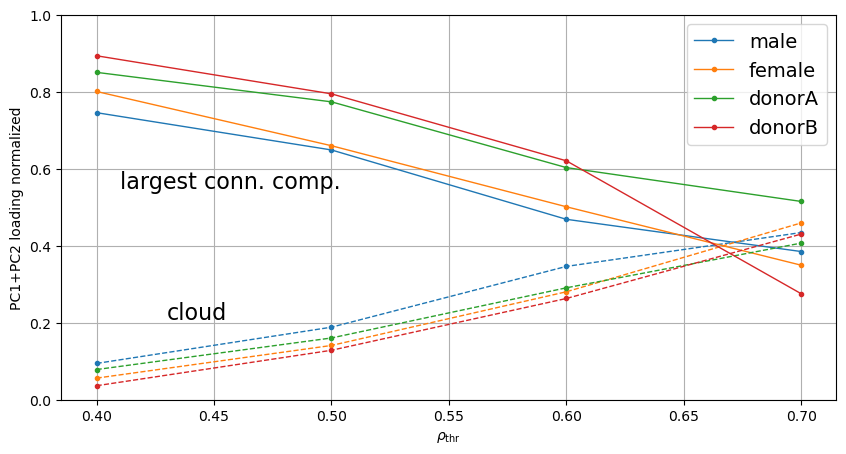

In [58]:
plt.figure(figsize=(10,5))
palette = sns.color_palette(n_colors=len(dnames))
for i, d in enumerate(dnames):
    plt.plot(rho_all, loading_all[d]['comp'], '.-', label=d,
             linewidth=1, color=palette[i])
    plt.plot(rho_all, loading_all[d]['cloud'], '.--',
             linewidth=1, color=palette[i])
plt.text(0.43, 0.21, 'cloud', fontsize=16)
plt.text(0.41, 0.55, 'largest conn. comp.', fontsize=16)
plt.ylim([0, 1])
plt.legend(prop={'size': 14})
plt.xlabel(r'$\rho_{\rm thr}$')
plt.ylabel('PC1+PC2 loading normalized')
plt.grid()
plt.savefig(MAIN_PATH / 'output' / 'examples' / f'rho-vs-loading_{r_thr}.png', dpi=400, bbox_inches='tight')

## Supplementary Figure 19

In [59]:
r_thr = 0.6

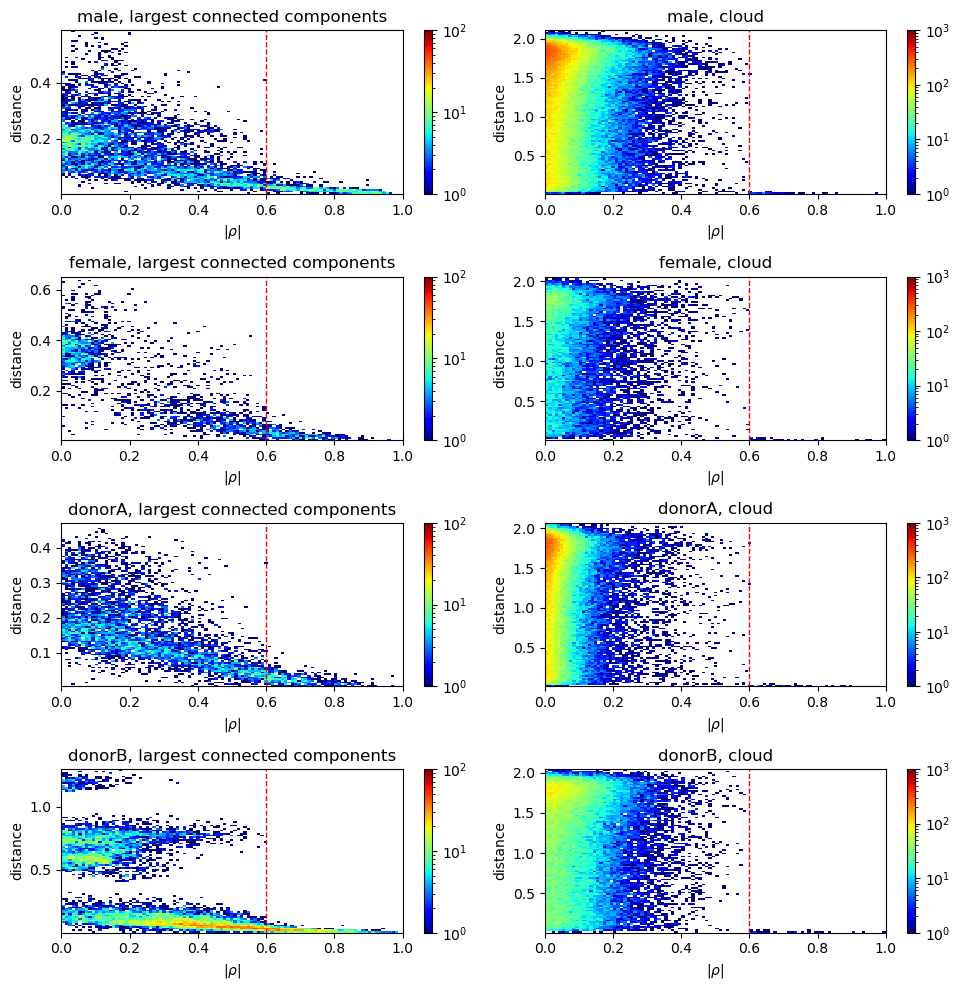

In [60]:
plt.figure(figsize=(10, 10))
for i, dname in enumerate(dnames):
    for j, (lab, comps) in enumerate(zip(['largest connected components', 'cloud'],
                                         (comps_all[dname][r_thr], nxcloud_all[dname][r_thr]))):
        if j == 0:
            vmax = 100
        else:
            vmax = 1000
        poses = np.array([poses_all[r_thr][dname][k] for k in comps])
        col_idx = [clr_df[dname].columns.get_loc(col) for col in comps]
        rhos = abs(rho_res[dname][col_idx, :][:, col_idx])
        rhos = rhos[np.triu_indices(len(rhos), k=1)]
        plt.subplot(4, 2, 2*i+j+1)
        plt.hist2d(rhos, pdist(poses), (100, 100), 
                   norm=mpl.colors.LogNorm(vmin=1, vmax=vmax), cmap=plt.cm.jet)
        plt.axvline(r_thr, color='r', linestyle='--', linewidth=1)
        plt.xlim([0, 1])
        plt.xlabel(r"$|\rho|$")
        plt.ylabel("distance")
        cbar=plt.colorbar()#location='bottom')
        cbar.ax.tick_params(axis='both', which='major')
        plt.title(f"{dname}, {lab}")
plt.tight_layout()
plt.savefig(MAIN_PATH / 'output' / 'examples' / f'rho-vs-distance_{r_thr}.png', dpi=400, bbox_inches='tight')        